In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# HASH BASED DEDUPLICATION

In [ ]:
"""
Restore images belonging to lung_n from /quarantine/quality back to /LC25000/lung_n.
- Matches by filename prefix 'lungn' (LC25000 naming convention).
- Then re-run Step-2 filtering on that folder with relaxed thresholds.
"""

from pathlib import Path
import shutil
from tqdm import tqdm

ROOT      = Path("/content/drive/MyDrive/histo")
SRC_QUAR  = ROOT / "quarantine" / "quality"
DST_CLASS = ROOT / "LC25000" / "lung_n"

DST_CLASS.mkdir(parents=True, exist_ok=True)

moved = 0
for p in tqdm(list(SRC_QUAR.glob("lungn*.jpeg")) + list(SRC_QUAR.glob("lungn*.jpg")), desc="Restoring lung_n"):
    shutil.move(str(p), str(DST_CLASS / p.name))
    moved += 1

print(f"✅ Restored {moved} files to {DST_CLASS}")


Restoring lung_n: 0it [00:00, ?it/s]

✅ Restored 0 files to /content/drive/MyDrive/histo/LC25000/lung_n


In [ ]:
"""
Stage: Metadata & Duplicate Analysis (Step 3 of Cleaning)
Folder: LC25000/lung_aca
Purpose:
    - Extract image-level metadata (size, mode, hash)
    - Detect exact and near duplicates using perceptual hashing (phash)
    - Identify corrupted or unreadable images
Output:
    - manifest_lung_aca.csv
    - duplicates_lung_aca.csv
    - sample visualizations of duplicate pairs
"""

import os
from pathlib import Path
import pandas as pd
from PIL import Image
import imagehash
from tqdm import tqdm
import matplotlib.pyplot as plt

# ==== CONFIG ====
DATA_DIR = Path("/content/drive/MyDrive/histo/LC25000/lung_n")
OUTPUT_DIR = Path("/content/drive/MyDrive/histo/clean_logs")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

hash_algo = imagehash.phash
near_hamming_threshold = 4  # <=4 bits = near duplicate

# ==== EXTRACTION ====
records = []
hash_map = {}  # hash -> first path
duplicates = []

# New (scans both .jpg and .jpeg)
img_paths = list(DATA_DIR.glob("*.jpg")) + list(DATA_DIR.glob("*.jpeg"))
for img_path in tqdm(sorted(img_paths), desc="Scanning"):

    try:
        img = Image.open(img_path).convert("RGB")
        w, h = img.size
        ih = hash_algo(img)
        ih_str = str(ih)
        records.append({
            "filename": img_path.name,
            "path": str(img_path),
            "width": w,
            "height": h,
            "hash": ih_str
        })
        # duplicate check
        for old_hash, old_path in hash_map.items():
            if ih - imagehash.hex_to_hash(old_hash) <= near_hamming_threshold:
                duplicates.append((img_path.name, old_path, ih - imagehash.hex_to_hash(old_hash)))
        hash_map[ih_str] = str(img_path)
    except Exception as e:
        records.append({
            "filename": img_path.name,
            "path": str(img_path),
            "width": None,
            "height": None,
            "hash": None,
            "error": str(e)
        })

manifest_df = pd.DataFrame(records)
manifest_df.to_csv(OUTPUT_DIR / "manifest_lung_aca.csv", index=False)

dups_df = pd.DataFrame(duplicates, columns=["file_1", "file_2", "hamming_dist"])
dups_df.to_csv(OUTPUT_DIR / "duplicates_lung_aca.csv", index=False)

print(f" Metadata extraction done. {len(manifest_df)} files scanned.")
print(f" {len(dups_df)} near duplicates found (≤{near_hamming_threshold} bits).")


Scanning: 100%|██████████| 4365/4365 [05:35<00:00, 13.02it/s]

 Metadata extraction done. 4365 files scanned.
 626 near duplicates found (≤4 bits).


In [ ]:
"""
Purpose:
    Load and inspect the model-audit log generated in Stage 3.
    This CSV contains per-image details like filename, true label, predicted label,
    ensemble confidence, and final audit status (flagged / uncertain / clean).
"""

import pandas as pd

# Path to your model-audit CSV
csv_path = "/content/drive/MyDrive/histo/clean_logs/duplicates_lung_aca.csv"

# Load the file using pandas
df_audit = pd.read_csv(csv_path)

# Display the shape and first few rows
print(f"CSV loaded successfully! Shape: {df_audit.shape}")
display(df_audit.head(10))  # display first 10 rows for better context


CSV loaded successfully! Shape: (626, 3)


,file_1,file_2,hamming_dist
0,lungn1135.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0
1,lungn1314.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,4
2,lungn1370.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,4
3,lungn1412.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,4
4,lungn1435.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0
5,lungn1472.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,4
6,lungn1490.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,2
7,lungn1491.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,4
8,lungn1491.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0
9,lungn1534.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0


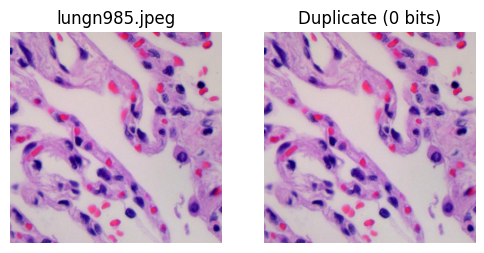

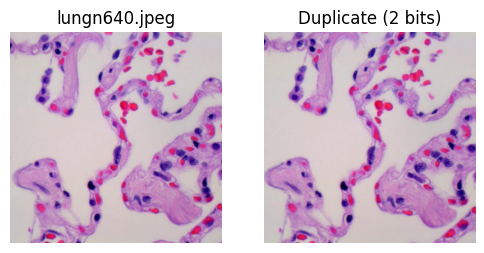

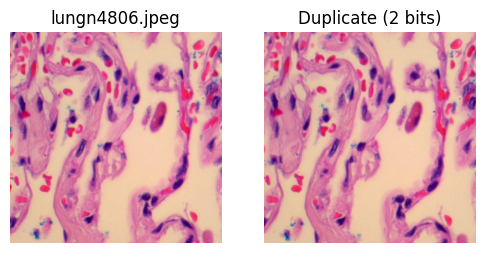

In [ ]:
"""
Display sample duplicate pairs to verify visually
"""

sample_pairs = dups_df.sample(min(3, len(dups_df))) if len(dups_df) > 0 else []
for _, row in sample_pairs.iterrows():
    f1 = Image.open(DATA_DIR / row.file_1)
    f2 = Image.open(Path(row.file_2))
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))
    ax[0].imshow(f1)
    ax[0].set_title(row.file_1)
    ax[1].imshow(f2)
    ax[1].set_title(f"Duplicate ({row.hamming_dist} bits)")
    for a in ax: a.axis("off")
    plt.show()


# RULE BASED

MAX_MEAN_INTENSITY = 245    # too bright → remove

MIN_MEAN_INTENSITY = 5      # too dark → remove

TISSUE_MIN_RATIO   = 0.15   # less than 15% tissue → mostly background

MIN_SHARPNESS_VAR  = 40.0   # blur threshold


In [ ]:
from pathlib import Path

DATA_DIR = Path("/content/drive/MyDrive/histo/LC25000/lung_n")
files = list(DATA_DIR.glob("*"))
print(f"Found {len(files)} items in {DATA_DIR}")
for f in files[:10]:
    print("→", f.name)


Found 0 items in /content/drive/MyDrive/histo/LC25000/lung_n


RESTORING..

In [ ]:
# """
# Restore images belonging to lung_n from /quarantine/quality back to /LC25000/lung_n.
# - Matches by filename prefix 'lungn' (LC25000 naming convention).
# - Then re-run Step-2 filtering on that folder with relaxed thresholds.
# """

# from pathlib import Path
# import shutil
# from tqdm import tqdm

# ROOT      = Path("/content/drive/MyDrive/histo")
# SRC_QUAR  = ROOT / "quarantine" / "quality"
# DST_CLASS = ROOT / "LC25000" / "lung_n"

# DST_CLASS.mkdir(parents=True, exist_ok=True)

# moved = 0
# for p in tqdm(list(SRC_QUAR.glob("lungn*.jpeg")) + list(SRC_QUAR.glob("lungn*.jpg")), desc="Restoring lung_n"):
#     shutil.move(str(p), str(DST_CLASS / p.name))
#     moved += 1

# print(f"✅ Restored {moved} files to {DST_CLASS}")


Restoring lung_n: 100%|██████████| 5000/5000 [00:13<00:00, 376.75it/s]

✅ Restored 5000 files to /content/drive/MyDrive/histo/LC25000/lung_n


Scanning: /content/drive/MyDrive/histo/LC25000/lung_n
Found 5000 images to evaluate.


Quality filtering: 100%|██████████| 5000/5000 [01:56<00:00, 42.85it/s]



CSV written → /content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv
Kept: 4198 | Rejected: 802


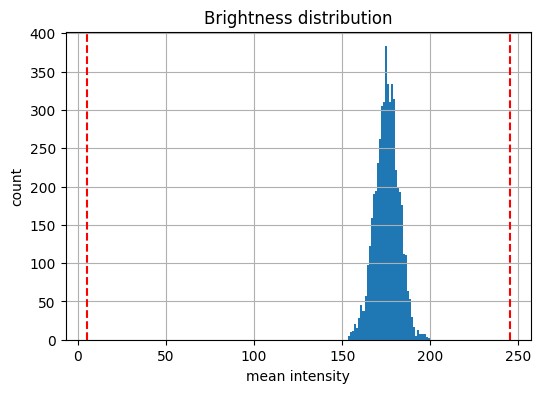

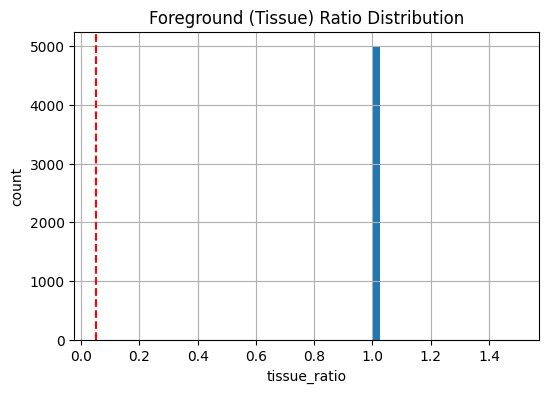

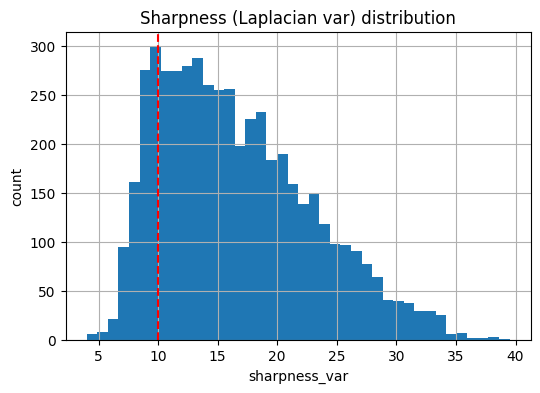

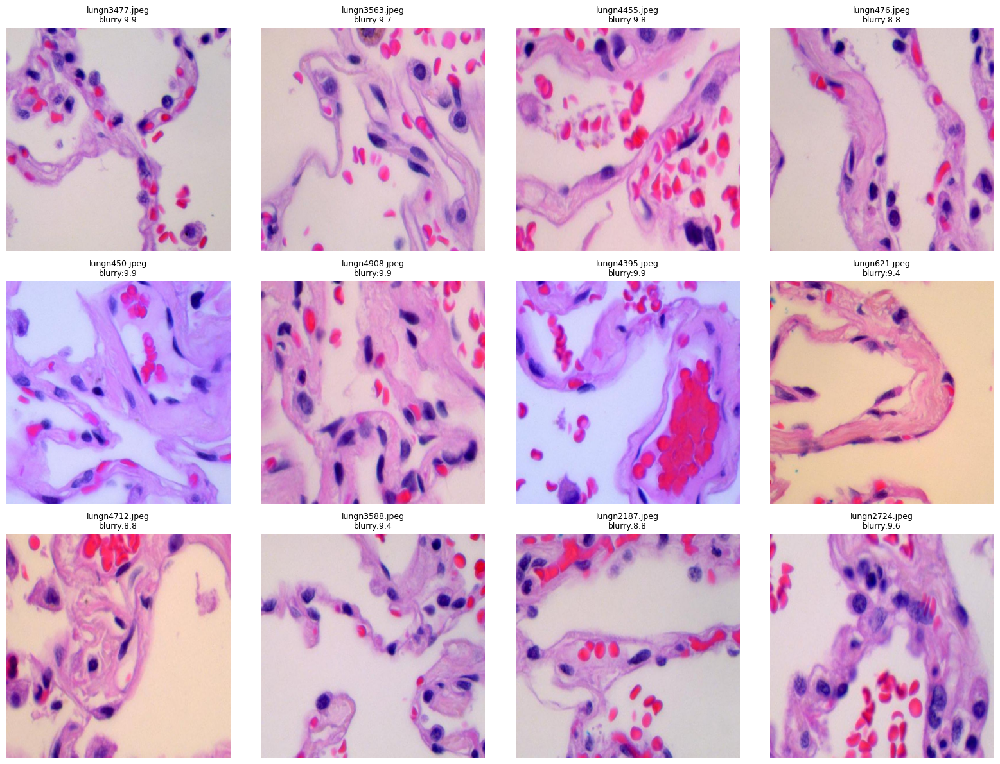

In [ ]:
"""
Step 2 — Image Quality Filtering for LC25000 (with inline preview of removed images)
Dataset example: /content/drive/MyDrive/histo/LC25000/lung_n

Purpose:
    Detect and quarantine low-quality patches using simple, explainable metrics:
    - mean intensity (exposure)
    - foreground/tissue ratio (background-only detection)
    - Laplacian variance (blur/focus)

Flow:
    1) Scan class folder for *.jpg/*.jpeg/*.png
    2) Compute metrics per image
    3) If any metric violates thresholds → move to /quarantine/quality with reason
    4) Save CSV log (kept+rejected) to /clean_logs
    5) Plot histograms and SHOW a random grid of rejected samples

Notes:
    - Start with conservative thresholds; tune by inspecting the previews & histograms.
    - Safe-prints avoid crashes if a folder is empty (e.g., after a previous run moved everything).
    - If the class folder is empty, you can either move files back from quarantine or
      set DATA_DIR to the quarantine folder to preview previously removed items.
"""

# ======== Imports & Paths ========
from pathlib import Path
import shutil, random
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

# ---- Configure your class here ----
DATA_DIR = Path("/content/drive/MyDrive/histo/LC25000/lung_n")   # change to colon_aca, lung_aca, etc.
ROOT     = Path("/content/drive/MyDrive/histo")
LOG_DIR  = ROOT / "clean_logs"
Q_QUALITY = ROOT / "quarantine" / "quality"

for d in (LOG_DIR, Q_QUALITY):
    d.mkdir(parents=True, exist_ok=True)

# ======== Thresholds (tune as needed) ========
MAX_MEAN_INTENSITY = 245      # too bright → likely background/overexposed
MIN_MEAN_INTENSITY = 5        # too dark → scanner artifact
TISSUE_MIN_RATIO   = 0.05     # < 5% tissue → mostly background
MIN_SHARPNESS_VAR  = 10.0     # low Laplacian variance → blurry

# ======== Helpers ========
def load_paths(folder: Path):
    exts = ("*.jpg", "*.jpeg", "*.png")
    paths = []
    for e in exts:
        paths += list(folder.glob(e))
    return sorted(paths)

def compute_quality(img_rgb: np.ndarray):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    mean_int = float(gray.mean())
    tissue_ratio = float((gray < 240).mean())     # heuristic foreground threshold
    sharp_var = float(cv2.Laplacian(gray, cv2.CV_64F).var())
    return mean_int, tissue_ratio, sharp_var

# ======== Scan & Filter ========
img_paths = load_paths(DATA_DIR)

print(f"Scanning: {DATA_DIR}")
print(f"Found {len(img_paths)} images to evaluate.")

records, quarantined = [], []

if len(img_paths) == 0:
    # Nothing to process; print guidance and stop gracefully
    print("No images found in the class folder.")
    print("If you previously moved everything to quarantine, either:")
    print("  1) Move them back to the class folder, OR")
    print("  2) Temporarily set DATA_DIR = '/content/drive/MyDrive/histo/quarantine/quality' to preview those images.")
else:
    for p in tqdm(img_paths, desc="Quality filtering"):
        # robust load
        try:
            img = Image.open(p).convert("RGB")
            arr = np.array(img)
        except Exception as e:
            # treat unreadable as reject with reason 'read_error'
            records.append({
                "filename": p.name, "path": str(p),
                "mean_intensity": None, "tissue_ratio": None, "sharpness_var": None,
                "status": "reject", "reason": f"read_error:{type(e).__name__}"
            })
            dst = Q_QUALITY / p.name
            shutil.move(str(p), str(dst))
            quarantined.append({"filename": p.name, "reason": f"read_error:{type(e).__name__}", "dst": str(dst)})
            continue

        mean_int, tissue_ratio, sharp_var = compute_quality(arr)

        status, reason = "keep", ""
        if mean_int > MAX_MEAN_INTENSITY or mean_int < MIN_MEAN_INTENSITY:
            status, reason = "reject", f"bad_exposure:{mean_int:.1f}"
        elif tissue_ratio < TISSUE_MIN_RATIO:
            status, reason = "reject", f"low_tissue:{tissue_ratio:.3f}"
        elif sharp_var < MIN_SHARPNESS_VAR:
            status, reason = "reject", f"blurry:{sharp_var:.1f}"

        records.append({
            "filename": p.name,
            "path": str(p),
            "mean_intensity": mean_int,
            "tissue_ratio": tissue_ratio,
            "sharpness_var": sharp_var,
            "status": status,
            "reason": reason
        })

        if status == "reject":
            dst = Q_QUALITY / p.name
            shutil.move(str(p), str(dst))
            quarantined.append({"filename": p.name, "reason": reason, "dst": str(dst)})

# ======== Save CSV ========
df = pd.DataFrame(records)
csv_out = LOG_DIR / f"stage2_quality_{DATA_DIR.name}.csv"
df.to_csv(csv_out, index=False)
print(f"\nCSV written → {csv_out}")

if "status" in df.columns:
    n_reject = int((df["status"] == "reject").sum())
    n_keep   = int((df["status"] == "keep").sum())
    print(f"Kept: {n_keep} | Rejected: {n_reject}")
else:
    print("No rows recorded (empty folder).")

# ======== Plots ========
if len(df) > 0:
    plt.figure(figsize=(6,4))
    df["mean_intensity"].dropna().hist(bins=40)
    plt.axvline(MAX_MEAN_INTENSITY, color="r", linestyle="--")
    plt.axvline(MIN_MEAN_INTENSITY, color="r", linestyle="--")
    plt.title("Brightness distribution"); plt.xlabel("mean intensity"); plt.ylabel("count")
    plt.show()

    plt.figure(figsize=(6,4))
    df["tissue_ratio"].dropna().hist(bins=40)
    plt.axvline(TISSUE_MIN_RATIO, color="r", linestyle="--")
    plt.title("Foreground (Tissue) Ratio Distribution"); plt.xlabel("tissue_ratio"); plt.ylabel("count")
    plt.show()

    plt.figure(figsize=(6,4))
    df["sharpness_var"].dropna().hist(bins=40)
    plt.axvline(MIN_SHARPNESS_VAR, color="r", linestyle="--")
    plt.title("Sharpness (Laplacian var) distribution"); plt.xlabel("sharpness_var"); plt.ylabel("count")
    plt.show()

# ======== Show a grid of removed images ========
to_show = quarantined[:]
random.shuffle(to_show)
to_show = to_show[:min(12, len(to_show))]  # up to 12 previews

if len(to_show) == 0:
    print("No rejected images to preview.")
else:
    cols = 4
    rows = int(np.ceil(len(to_show) / cols))
    plt.figure(figsize=(4*cols, 4*rows))
    for i, q in enumerate(to_show):
        try:
            img = Image.open(q["dst"])
        except Exception:
            continue
        plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.title(f"{q['filename']}\n{q['reason']}", fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()


Loaded CSV: /content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv
Columns: ['filename', 'path', 'mean_intensity', 'tissue_ratio', 'sharpness_var', 'status', 'reason']
Total images logged: 5000

Top 4 blurriest images:
            filename  sharpness_var      reason
2509  lungn3257.jpeg       4.013156  blurry:4.0
4042  lungn4637.jpeg       4.549301  blurry:4.5
768   lungn1690.jpeg       4.550858  blurry:4.6
4919   lungn926.jpeg       4.610779  blurry:4.6


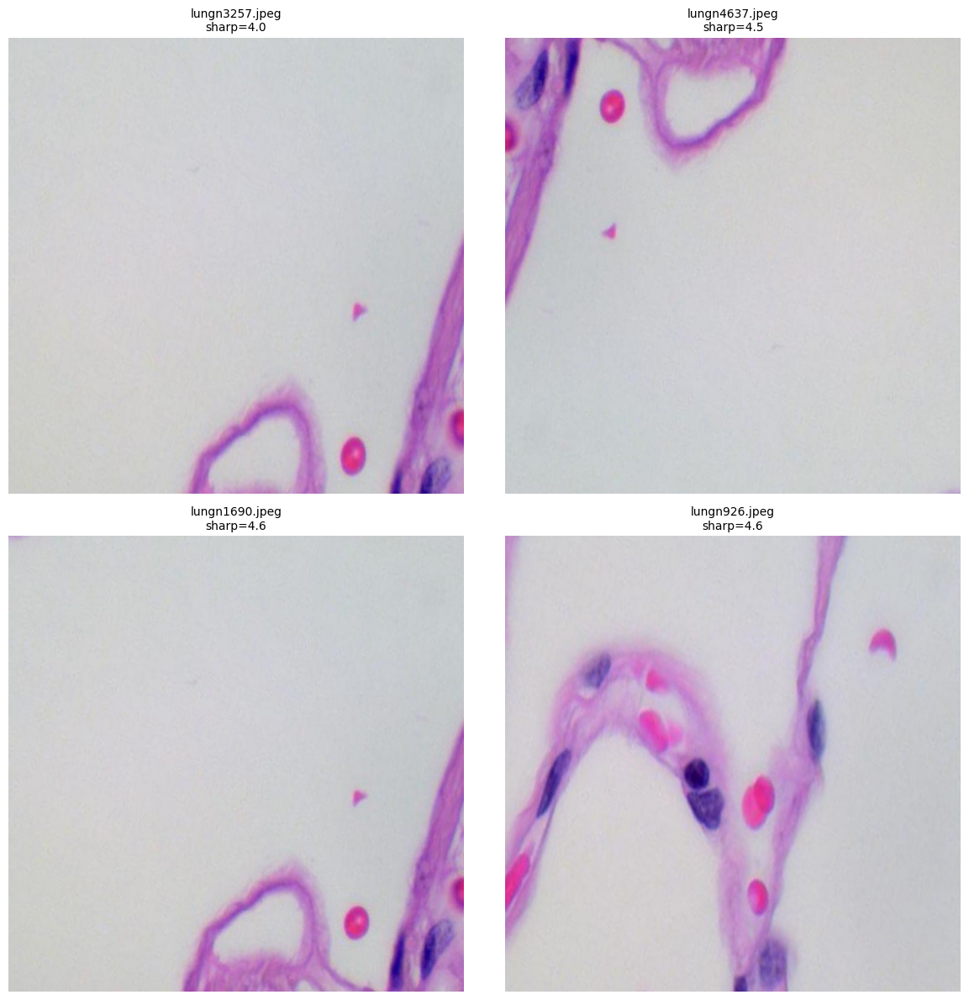

In [ ]:
"""
Purpose:
    Identify and preview the top-N most blurry (lowest Laplacian variance)
    images from an existing quality-cleaning CSV log.

Logic:
    1. Load the cleaning log CSV (already created in Stage 2).
    2. Sort by 'sharpness_var' ascending.
    3. Show top N blurriest images as a visual grid.
    4. Works directly on cleaned dataset without recomputation.

Notes:
    - Requires the CSV generated by your rule-based cleaning step.
    - Reads paths from the 'path' column in the CSV.
    - If some paths were moved to quarantine, make sure the CSV points to
      accessible image paths (or adjust accordingly).
"""

# ===== Imports =====
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# ===== Config =====
CSV_PATH = Path("/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv")  # change as needed
TOP_N = 4  # number of blurriest images to show

# ===== Load and Check =====
df = pd.read_csv(CSV_PATH)
print(f"Loaded CSV: {CSV_PATH}")
print(f"Columns: {list(df.columns)}")
print(f"Total images logged: {len(df)}")

# Filter out missing sharpness values
df = df.dropna(subset=["sharpness_var"])

# Sort by sharpness (ascending = blurriest first)
df_sorted = df.sort_values(by="sharpness_var", ascending=True)

# Select top-N
top_blurry = df_sorted.head(TOP_N)
print(f"\nTop {TOP_N} blurriest images:")
print(top_blurry[["filename", "sharpness_var", "reason"]])

# ===== Display Grid =====
if len(top_blurry) > 0:
    cols = 2
    rows = int(np.ceil(len(top_blurry) / cols))
    plt.figure(figsize=(6*cols, 6*rows))
    for i, row in enumerate(top_blurry.itertuples()):
        try:
            img = Image.open(row.path)
            plt.subplot(rows, cols, i+1)
            plt.imshow(img)
            plt.title(f"{row.filename}\nsharp={row.sharpness_var:.1f}", fontsize=10)
            plt.axis("off")
        except Exception as e:
            print(f"Error loading {row.path}: {e}")
    plt.tight_layout()
    plt.show()
else:
    print("No valid image entries found.")


Loaded 5000 rows from stage2_quality_lung_n.csv
Remaining after filtering (tissue_ratio >= 0.15): 5000

Top 6 blurriest images (with tissue):
            filename  tissue_ratio  sharpness_var
2509  lungn3257.jpeg           1.0       4.013156
4042  lungn4637.jpeg           1.0       4.549301
768   lungn1690.jpeg           1.0       4.550858
4919   lungn926.jpeg           1.0       4.610779
996   lungn1896.jpeg           1.0       4.769050
3249  lungn3923.jpeg           1.0       4.876166


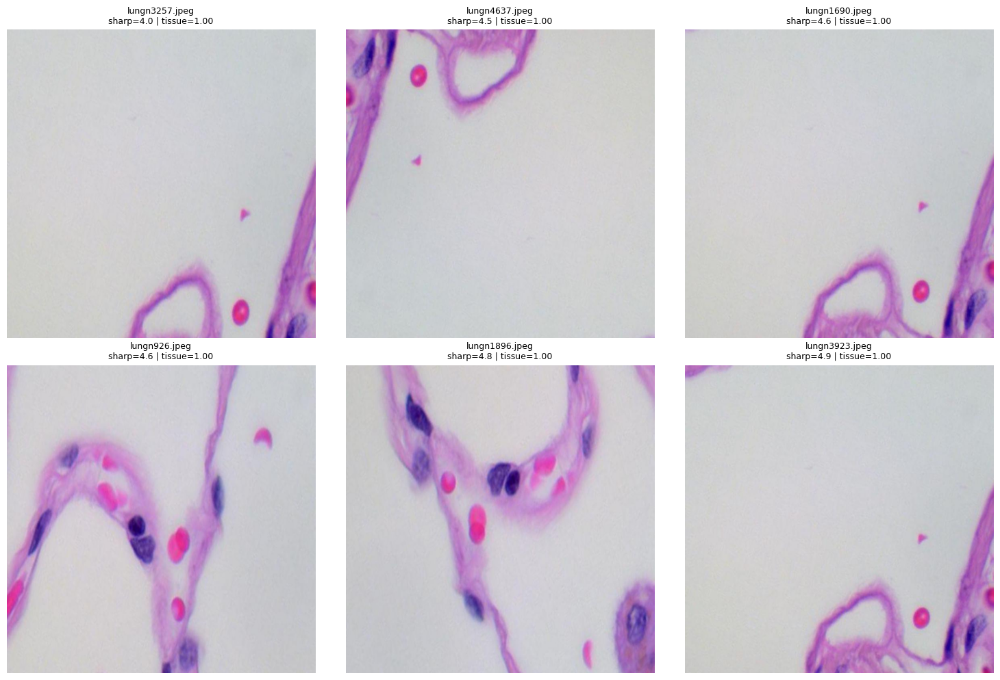

In [ ]:
"""
Purpose:
    Show the top-N blurriest images that still have tissue content,
    using existing cleaning CSV logs.

Logic:
    1. Load stage2_quality CSV (with mean_intensity, tissue_ratio, sharpness_var).
    2. Filter out patches that are mostly empty background (low tissue_ratio).
    3. Sort remaining images by sharpness_var ascending.
    4. Display top-N blurriest "real" tissue images.

Notes:
    - Adjust MIN_TISSUE_RATIO if you still see too many empty tiles.
    - Does not modify any files — safe to run in Colab.
"""

# ===== Imports =====
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from pathlib import Path

# ===== Config =====
CSV_PATH = Path("/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv")  # update as needed
TOP_N = 6                   # number of images to show
MIN_TISSUE_RATIO = 0.15     # ignore empty/white patches (tune if needed)

# ===== Load =====
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} rows from {CSV_PATH.name}")

# ===== Filter =====
df = df.dropna(subset=["tissue_ratio", "sharpness_var"])
df_filtered = df[df["tissue_ratio"] >= MIN_TISSUE_RATIO]   # keep only tissue-rich patches

print(f"Remaining after filtering (tissue_ratio >= {MIN_TISSUE_RATIO}): {len(df_filtered)}")

# ===== Sort by sharpness_var (blurriest first) =====
df_sorted = df_filtered.sort_values(by="sharpness_var", ascending=True)
top_blurry = df_sorted.head(TOP_N)
print(f"\nTop {TOP_N} blurriest images (with tissue):")
print(top_blurry[["filename", "tissue_ratio", "sharpness_var"]])

# ===== Visualize =====
if len(top_blurry) > 0:
    cols = 3
    rows = int(np.ceil(len(top_blurry) / cols))
    plt.figure(figsize=(5*cols, 5*rows))
    for i, row in enumerate(top_blurry.itertuples()):
        try:
            img = Image.open(row.path)
            plt.subplot(rows, cols, i+1)
            plt.imshow(img)
            plt.title(f"{row.filename}\nsharp={row.sharpness_var:.1f} | tissue={row.tissue_ratio:.2f}", fontsize=9)
            plt.axis("off")
        except Exception as e:
            print(f"Error loading {row.path}: {e}")
    plt.tight_layout()
    plt.show()
else:
    print("No valid tissue-rich blurry images found.")


Loaded CSV: /content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv
Columns: ['filename', 'path', 'mean_intensity', 'tissue_ratio', 'sharpness_var', 'status', 'reason']
Total rows: 5000
Rejects by type -> exposure: 0, low_tissue: 0, blurry: 802

[Top bad_exposure]
(no preview table)

[Top low_tissue]
(no preview table)

[Top blurry]
            filename  sharpness_var      reason
2509  lungn3257.jpeg       4.013156  blurry:4.0
4042  lungn4637.jpeg       4.549301  blurry:4.5
768   lungn1690.jpeg       4.550858  blurry:4.6
4919   lungn926.jpeg       4.610779  blurry:4.6
996   lungn1896.jpeg       4.769050  blurry:4.8
3249  lungn3923.jpeg       4.876166  blurry:4.9
1883  lungn2694.jpeg       5.311868  blurry:5.3
4339  lungn4904.jpeg       5.425987  blurry:5.4
[[Rejected: bad_exposure] worst examples] No samples to display.
[[Rejected: low_tissue] worst examples] No samples to display.


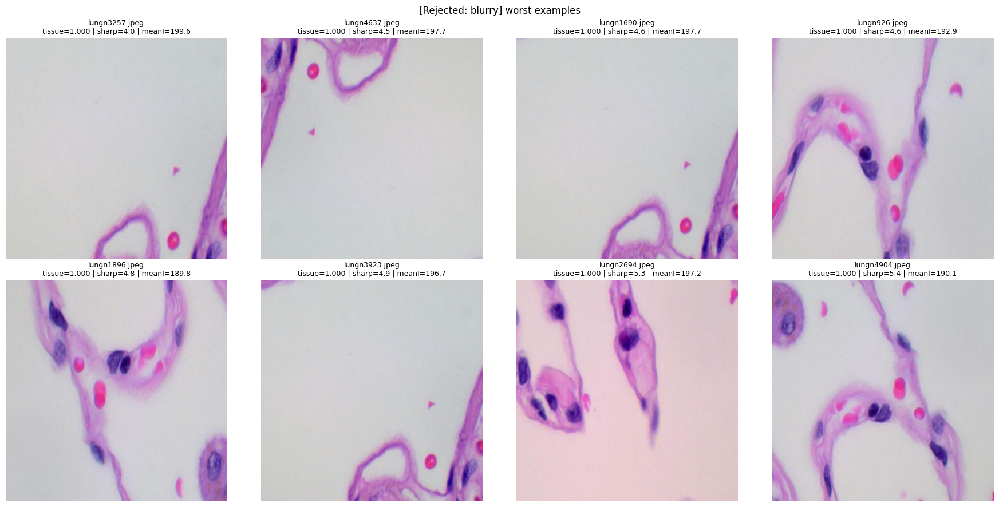

In [ ]:
"""
Purpose:
    From an existing Stage-2 quality CSV, display representative rejected images
    for each rule-based failure type:
      (1) bad_exposure:*  -> over/under-exposed (mean intensity)
      (2) low_tissue:*    -> mostly background (low tissue ratio)
      (3) blurry:*        -> out-of-focus (low Laplacian variance)

Logic:
    - Read CSV with columns: path, filename, mean_intensity, tissue_ratio,
      sharpness_var, status, reason (e.g., "bad_exposure:253.1").
    - Filter to rows where status == "reject".
    - Parse the "reason" prefix before ":" to determine the rejection type.
    - For each type:
        * bad_exposure: sort by parsed numeric exposure severity (further from midrange).
          If numeric isn't present, fall back to mean_intensity extremes.
        * low_tissue:   sort by ascending tissue_ratio (lowest first).
        * blurry:       sort by ascending sharpness_var (lowest first).
    - Pick top-N per type and render a grid of images with minimal titles.

Notes:
    - This script does NOT re-compute metrics or move files; it only visualizes.
    - If any category is empty, it prints a friendly message and skips the grid.
    - If some images were moved to quarantine, ensure the 'path' in CSV is still valid.
    - Tweak TOP_N_PER_TYPE to show more/fewer samples per category.
"""

# ========== Imports ==========
import re
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ========== Config ==========
CSV_PATH = Path("/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv")  # <-- change per class
TOP_N_PER_TYPE = 8  # Show up to N samples for each of: bad_exposure, low_tissue, blurry

# when exposure numbers aren't in "reason", sort by mean_intensity distance to this mid
EXPOSURE_MID_INTENSITY = 127.5  # 8-bit mid-grey; used only as a fallback sorter

# ========== Helpers ==========
def parse_reason_type_and_value(reason: str):
    """
    Parse reason like "bad_exposure:253.1" -> ("bad_exposure", 253.1)
    or "low_tissue:0.034" -> ("low_tissue", 0.034)
    or "blurry:9.1" -> ("blurry", 9.1)
    Returns (prefix, numeric_value_or_None).
    """
    if not isinstance(reason, str) or len(reason) == 0:
        return ("unknown", None)
    parts = reason.split(":", 1)
    prefix = parts[0].strip()
    val = None
    if len(parts) == 2:
        # try to parse trailing float
        try:
            val = float(parts[1].strip())
        except Exception:
            val = None
    return (prefix, val)

def pick_top_exposure(df_exp, top_n=8):
    """
    Choose 'worst' exposure examples.
    Priority:
      1) If reason holds numeric (e.g., bad_exposure:253.1), sort by distance from mid (127.5) descending.
      2) Else, use mean_intensity distance from mid.
    """
    if df_exp.empty:
        return df_exp

    # candidate numeric from reason (extracted_value); fallback to mean_intensity
    vals = []
    for r in df_exp.itertuples():
        prefix, val = parse_reason_type_and_value(getattr(r, "reason", ""))
        if val is None:
            mi = getattr(r, "mean_intensity", np.nan)
            # If mean_intensity missing, set to NaN (will be handled)
            vals.append(mi)
        else:
            vals.append(val)

    ser = pd.Series(vals, index=df_exp.index, dtype="float64")
    # If many NAs (no numbers at all), fallback purely to mean_intensity
    if ser.isna().all():
        if "mean_intensity" in df_exp.columns:
            ser = df_exp["mean_intensity"].astype(float)
        else:
            # fallback: no usable sorter, just return head
            return df_exp.head(top_n).copy()

    # sort by distance from mid, descending (worst exposures first)
    dist = (ser - EXPOSURE_MID_INTENSITY).abs()
    order = dist.sort_values(ascending=False).index
    return df_exp.loc[order].head(top_n).copy()

def pick_top_low_tissue(df_lt, top_n=8):
    """Choose lowest tissue_ratio first (most empty)."""
    if df_lt.empty:
        return df_lt
    if "tissue_ratio" not in df_lt.columns:
        return df_lt.head(top_n).copy()
    return df_lt.sort_values("tissue_ratio", ascending=True).head(top_n).copy()

def pick_top_blurry(df_blur, top_n=8):
    """Choose lowest sharpness_var first (most out-of-focus)."""
    if df_blur.empty:
        return df_blur
    if "sharpness_var" not in df_blur.columns:
        return df_blur.head(top_n).copy()
    return df_blur.sort_values("sharpness_var", ascending=True).head(top_n).copy()

def show_grid(df_part, title, cols=4):
    """Render a grid for a subset DataFrame that has 'path' and 'filename'."""
    if df_part.empty:
        print(f"[{title}] No samples to display.")
        return

    n = len(df_part)
    rows = int(np.ceil(n / cols))
    plt.figure(figsize=(4.5*cols, 4.5*rows))
    shown = 0
    for i, r in df_part.iterrows():
        path = r.get("path", "")
        try:
            img = Image.open(path)
        except Exception as e:
            print(f"Skipping (cannot open): {path} -> {e}")
            continue
        shown += 1
        plt.subplot(rows, cols, shown)
        plt.imshow(img)
        # Build a compact informative caption
        cap = r.get("filename", Path(path).name)
        tr = r.get("tissue_ratio", None)
        sv = r.get("sharpness_var", None)
        mi = r.get("mean_intensity", None)
        meta = []
        if tr is not None and not pd.isna(tr): meta.append(f"tissue={tr:.3f}")
        if sv is not None and not pd.isna(sv): meta.append(f"sharp={sv:.1f}")
        if mi is not None and not pd.isna(mi): meta.append(f"meanI={mi:.1f}")
        meta_s = " | ".join(meta)
        plt.title(f"{cap}\n{meta_s}", fontsize=9)
        plt.axis("off")
    plt.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

# ========== Load CSV ==========
df = pd.read_csv(CSV_PATH)
print(f"Loaded CSV: {CSV_PATH}")
print(f"Columns: {list(df.columns)}")
print(f"Total rows: {len(df)}")

# Keep only rejects (status == 'reject'), and drop missing paths
if "status" in df.columns:
    rejects = df[df["status"].astype(str).str.lower() == "reject"].copy()
else:
    # If no status column, fall back to rows that have a non-empty reason
    rejects = df[df["reason"].notna()].copy()

rejects = rejects.dropna(subset=["path"]).copy()

# Extract reason prefix to a separate column
rejects["reason_type"] = rejects["reason"].astype(str).str.split(":", n=1, expand=True)[0].str.strip()

# Subsets per type
df_bad_exposure = rejects[rejects["reason_type"] == "bad_exposure"].copy()
df_low_tissue   = rejects[rejects["reason_type"] == "low_tissue"].copy()
df_blurry       = rejects[rejects["reason_type"] == "blurry"].copy()

print(f"Rejects by type -> exposure: {len(df_bad_exposure)}, low_tissue: {len(df_low_tissue)}, blurry: {len(df_blurry)}")

# Pick top-N per type
top_exposure = pick_top_exposure(df_bad_exposure, top_n=TOP_N_PER_TYPE)
top_low_tis  = pick_top_low_tissue(df_low_tissue, top_n=TOP_N_PER_TYPE)
top_blurry   = pick_top_blurry(df_blurry, top_n=TOP_N_PER_TYPE)

# Optional: quick tables in console
def small_table(df_part, cols):
    cols = [c for c in cols if c in df_part.columns]
    if len(cols) > 0 and not df_part.empty:
        print(df_part[cols].head(TOP_N_PER_TYPE))
    else:
        print("(no preview table)")

print("\n[Top bad_exposure]")
small_table(top_exposure, ["filename", "mean_intensity", "reason"])

print("\n[Top low_tissue]")
small_table(top_low_tis, ["filename", "tissue_ratio", "reason"])

print("\n[Top blurry]")
small_table(top_blurry, ["filename", "sharpness_var", "reason"])

# Render one grid per type
show_grid(top_exposure, title="[Rejected: bad_exposure] worst examples", cols=4)
show_grid(top_low_tis,  title="[Rejected: low_tissue] worst examples", cols=4)
show_grid(top_blurry,   title="[Rejected: blurry] worst examples", cols=4)


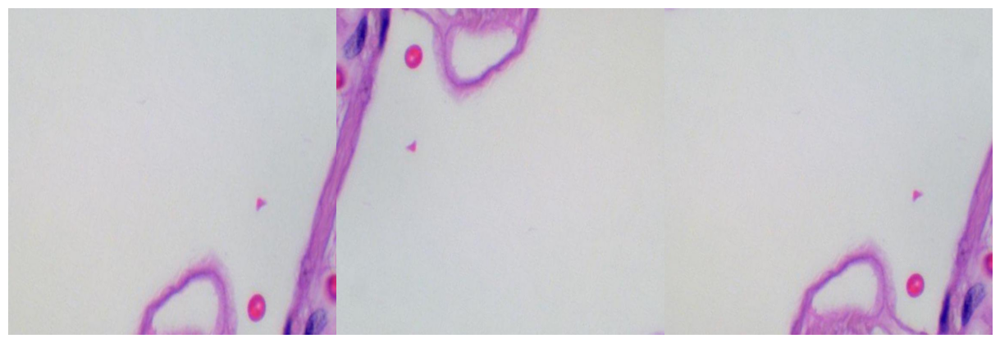

In [ ]:
"""
Purpose:
    Load the Stage-2 cleaning CSV, pick exactly 3 images, and display them
    in a single horizontal row with NO titles/captions/axes.

Selection policy:
    - Try to take one from each rejection type in this order:
        1) blurry (lowest sharpness_var)
        2) low_tissue (lowest tissue_ratio)
        3) bad_exposure (farthest from mid intensity)
    - If any category is empty, fall back to the next best from 'blurry'.
    - Guarantee exactly 3 images (skip unreadable paths silently).

How it works:
    - Reuses your parsing/sorting helpers.
    - Builds a 'picks' list of up to 3 paths in priority order.
    - Displays them in one row, no text.

Pitfalls:
    - Ensure CSV paths are accessible (e.g., not moved elsewhere).
    - If fewer than 3 readable images exist after filtering, you’ll see fewer.
"""

import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

# ===== Config =====
CSV_PATH = Path("/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv")
EXPOSURE_MID_INTENSITY = 127.5  # fallback center for exposure severity

# ===== Helpers (minimal) =====
def parse_reason_type_and_value(reason: str):
    if not isinstance(reason, str) or len(reason) == 0:
        return ("unknown", None)
    parts = reason.split(":", 1)
    prefix = parts[0].strip()
    val = None
    if len(parts) == 2:
        try:
            val = float(parts[1].strip())
        except Exception:
            val = None
    return (prefix, val)

def pick_top_exposure(df_exp, top_n=1):
    if df_exp.empty:
        return df_exp.head(0).copy()
    vals = []
    for r in df_exp.itertuples():
        _, v = parse_reason_type_and_value(getattr(r, "reason", ""))
        vals.append(v if v is not None else getattr(r, "mean_intensity", np.nan))
    ser = pd.Series(vals, index=df_exp.index, dtype="float64")
    if ser.isna().all():
        if "mean_intensity" in df_exp.columns:
            ser = df_exp["mean_intensity"].astype(float)
        else:
            return df_exp.head(top_n).copy()
    dist = (ser - EXPOSURE_MID_INTENSITY).abs()
    order = dist.sort_values(ascending=False).index
    return df_exp.loc[order].head(top_n).copy()

def pick_top_low_tissue(df_lt, top_n=1):
    if df_lt.empty:
        return df_lt.head(0).copy()
    if "tissue_ratio" not in df_lt.columns:
        return df_lt.head(top_n).copy()
    return df_lt.sort_values("tissue_ratio", ascending=True).head(top_n).copy()

def pick_top_blurry(df_blur, top_n=1):
    if df_blur.empty:
        return df_blur.head(0).copy()
    if "sharpness_var" not in df_blur.columns:
        return df_blur.head(top_n).copy()
    return df_blur.sort_values("sharpness_var", ascending=True).head(top_n).copy()

# ===== Load & split by reason =====
df = pd.read_csv(CSV_PATH)
if "status" in df.columns:
    rejects = df[df["status"].astype(str).str.lower() == "reject"].copy()
else:
    rejects = df[df["reason"].notna()].copy()
rejects = rejects.dropna(subset=["path"]).copy()
rejects["reason_type"] = rejects["reason"].astype(str).str.split(":", n=1, expand=True)[0].str.strip()

df_bad_exposure = rejects[rejects["reason_type"] == "bad_exposure"].copy()
df_low_tissue   = rejects[rejects["reason_type"] == "low_tissue"].copy()
df_blurry       = rejects[rejects["reason_type"] == "blurry"].copy()

# ===== Pick up to one from each, then fill from blurry to reach 3 =====
picks = []

top_blur_1 = pick_top_blurry(df_blurry, top_n=1)
if len(top_blur_1):
    picks.append(top_blur_1.iloc[0]["path"])

top_low_1 = pick_top_low_tissue(df_low_tissue, top_n=1)
if len(top_low_1):
    picks.append(top_low_1.iloc[0]["path"])

top_exp_1 = pick_top_exposure(df_bad_exposure, top_n=1)
if len(top_exp_1):
    picks.append(top_exp_1.iloc[0]["path"])

# fill from blurry to ensure exactly 3
if len(picks) < 3:
    # get more blurry samples skipping any already chosen
    more_blur = pick_top_blurry(df_blurry, top_n=5)
    for p in more_blur["path"].tolist():
        if p not in picks:
            picks.append(p)
        if len(picks) >= 3:
            break

# keep only first three
picks = picks[:3]

# ===== Display exactly 3, no captions =====
plt.figure(figsize=(12, 4))  # width scales the spacing; height keeps square-ish tiles
for i, path in enumerate(picks):
    try:
        img = Image.open(path)
    except Exception as e:
        continue
    plt.subplot(1, len(picks), i + 1)
    plt.imshow(img)
    plt.axis("off")
plt.tight_layout(pad=0.02)
plt.show()


Skipping /content/lungn3257.jpeg ([Errno 2] No such file or directory: '/content/lungn3257.jpeg')
Skipping /content/lungn4637.jpeg ([Errno 2] No such file or directory: '/content/lungn4637.jpeg')


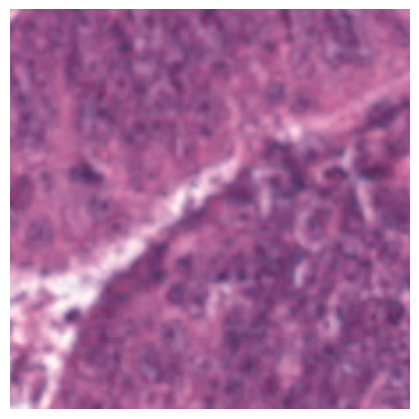

In [ ]:
"""
Purpose:
    Display exactly 3 patches in one horizontal row:
      [1] From CSV-sourced set (e.g., blurry)
      [2] From manually uploaded TUM set
      [3] From CSV-sourced set again
    No captions, no calculations, no titles — just pure image display.

Usage:
    - Update the image paths for csv_images[] and manual_images[].
    - Script shows [csv1, manual1, csv2] side-by-side in one row.
"""

from PIL import Image
import matplotlib.pyplot as plt

# ===== Replace these with your actual image paths =====
csv_images = [
    "/content/lungn3257.jpeg",  # 1st CSV-sourced
    "/content/lungn4637.jpeg",  # 2nd CSV-sourced (for later)
]

manual_images = [
    "/content/TUM-IGHMQCAH.tif",  # manually added TUM patch
]

# ===== Pick the desired sequence =====
display_images = [
    csv_images[0],
    manual_images[0],
    csv_images[1],
]

# ===== Display row =====
plt.figure(figsize=(12, 4))
for i, path in enumerate(display_images):
    try:
        img = Image.open(path)
        plt.subplot(1, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
    except Exception as e:
        print(f"Skipping {path} ({e})")
plt.tight_layout(pad=0)
plt.show()


Found 7 images from /content/TUM-*.tif
Prepared 7 images.
CSV written to /content/bad_examples_metrics.csv


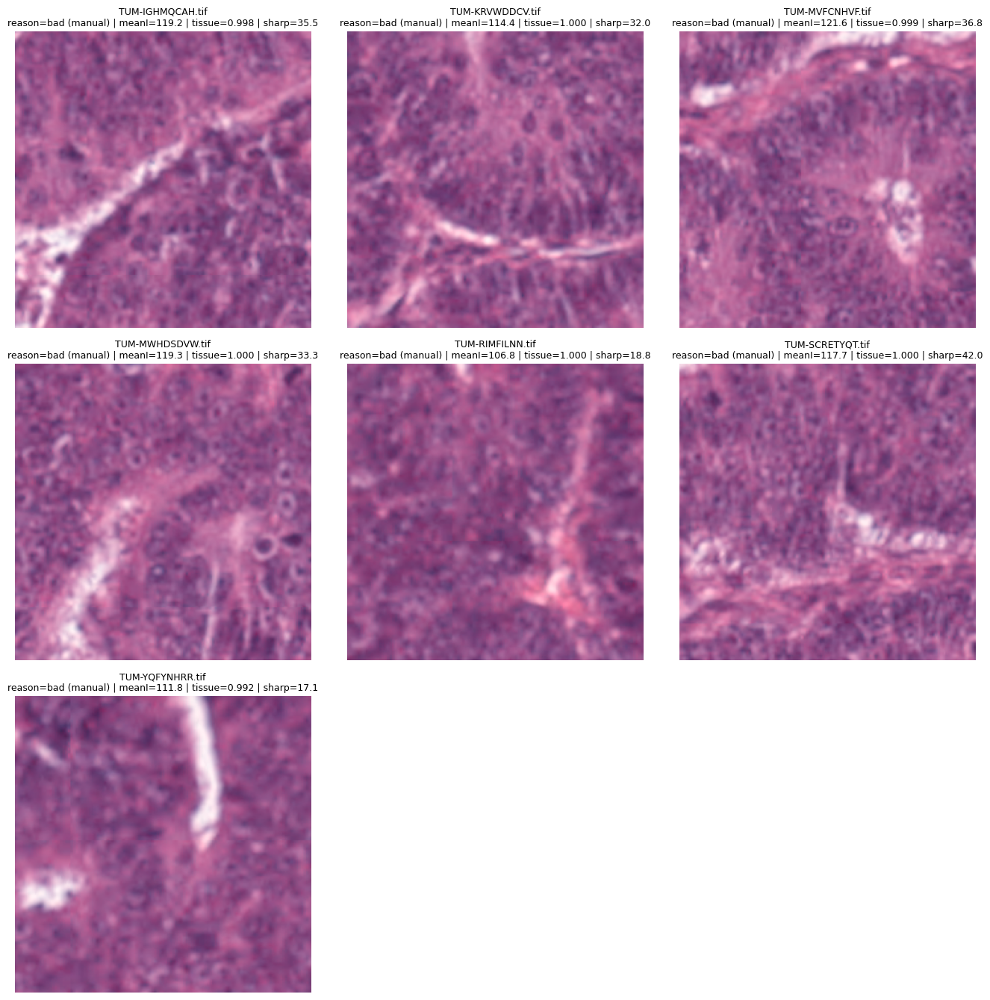

In [ ]:
"""
Purpose:
    Display a curated set of manually chosen "bad" .tif images in Colab,
    with clear captions and basic metrics to justify labeling.

Logic:
    - Discover images (glob pattern) or use an explicit file list.
    - Load using PIL (first page for multi-page TIFFs).
    - Compute quick metrics:
        * mean_intensity: average 8-bit grayscale intensity
        * tissue_ratio: fraction of pixels under a high threshold (proxy for foreground)
        * sharpness_var: Laplacian variance (lower ≈ blurrier)
    - Build labels per image: filename, optional reason, and numeric metrics.
    - Render a grid with tidy titles; optionally export a CSV.

Notes:
    - This does NOT move or modify files; safe to run repeatedly.
    - If you know the reason per image, fill REASONS below; otherwise it shows "bad (manual)".
    - For large TIFFs, a downscale factor is applied to speed up metric computation and display.
"""

from pathlib import Path
from typing import List, Dict, Tuple
import numpy as np
import pandas as pd
from PIL import Image, ImageOps
import cv2
import matplotlib.pyplot as plt

# =========================
# Configuration
# =========================
# Folder that contains your TUM-*.tif files (adjust as needed)
IMG_DIR = Path("/content")        # e.g., where your screenshot shows them
GLOB    = "TUM-*.tif"             # pattern to pick the files you showed

# Optional explicit reasons per file (edit if you want per-image labels)
# Example:
# REASONS = {
#   "TUM-IGHMQCAH.tif": "low_tissue",
#   "TUM-KRVWDDCV.tif": "blurry",
#   "TUM-MWHDSDVW.tif": "bad_exposure",
# }
REASONS: Dict[str, str] = {}

# Display options
TOP_N = None          # None = show all matched files, else an integer
COLS  = 3             # grid columns for display
DOWNSCALE_MAX = 1024  # downscale max edge for metrics/display to keep it fast

# CSV export (leave None to skip)
CSV_OUT = Path("/content/bad_examples_metrics.csv")  # or None to disable

# =========================
# Helpers
# =========================
def list_images(img_dir: Path, pattern: str) -> List[Path]:
    paths = sorted(img_dir.glob(pattern))
    if TOP_N is not None:
        paths = paths[:TOP_N]
    return paths

def load_first_page_rgb(p: Path) -> Image.Image:
    # Open first page of (possibly multi-page) TIFF and convert to RGB
    img = Image.open(p)
    try:
        img.seek(0)  # first frame
    except Exception:
        pass
    return img.convert("RGB")

def maybe_downscale(img: Image.Image, max_edge: int) -> Image.Image:
    w, h = img.size
    s = max(w, h)
    if s <= max_edge:
        return img
    scale = max_edge / float(s)
    new_w, new_h = int(w * scale), int(h * scale)
    return img.resize((new_w, new_h), Image.BICUBIC)

def compute_metrics(arr_rgb: np.ndarray) -> Tuple[float, float, float]:
    # Convert to gray uint8
    gray = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    # mean intensity (0..255)
    mean_int = float(gray.mean())
    # simple tissue ratio: fraction below a high threshold (tuned for H&E backgrounds)
    tissue_ratio = float((gray < 240).mean())
    # Laplacian variance for sharpness
    sharp_var = float(cv2.Laplacian(gray, cv2.CV_64F).var())
    return mean_int, tissue_ratio, sharp_var

def title_text(fname: str, reason: str, meanI: float, tissue: float, sharp: float) -> str:
    r = reason if reason else "bad (manual)"
    return f"{fname}\nreason={r} | meanI={meanI:.1f} | tissue={tissue:.3f} | sharp={sharp:.1f}"

# =========================
# Main
# =========================
paths = list_images(IMG_DIR, GLOB)
print(f"Found {len(paths)} images from {IMG_DIR}/{GLOB}")

records = []
thumbs  = []

for p in paths:
    try:
        img = load_first_page_rgb(p)
        img = maybe_downscale(img, DOWNSCALE_MAX)
        arr = np.array(img)
        meanI, tissue, sharp = compute_metrics(arr)
        reason = REASONS.get(p.name, "bad (manual)")
        rec = {
            "filename": p.name,
            "path": str(p),
            "reason": reason,
            "mean_intensity": meanI,
            "tissue_ratio": tissue,
            "sharpness_var": sharp,
            "width": img.size[0],
            "height": img.size[1],
        }
        records.append(rec)
        thumbs.append((img, title_text(p.name, reason, meanI, tissue, sharp)))
    except Exception as e:
        print(f"Skipping {p.name}: {type(e).__name__} - {e}")

df = pd.DataFrame.from_records(records)
print(f"Prepared {len(df)} images.")

if CSV_OUT is not None and len(df) > 0:
    df.to_csv(CSV_OUT, index=False)
    print(f"CSV written to {CSV_OUT}")

# =========================
# Display grid
# =========================
n = len(thumbs)
if n == 0:
    print("No images to display.")
else:
    cols = COLS
    rows = int(np.ceil(n / cols))
    plt.figure(figsize=(4.5*cols, 4.5*rows))
    i = 0
    for img, cap in thumbs:
        i += 1
        plt.subplot(rows, cols, i)
        plt.imshow(img)
        plt.title(cap, fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()


Error loading /content/lungn3257.jpeg: [Errno 2] No such file or directory: '/content/lungn3257.jpeg'
Error loading /content/lungn4637.jpeg: [Errno 2] No such file or directory: '/content/lungn4637.jpeg'
Error loading /content/lungn1690.jpeg: [Errno 2] No such file or directory: '/content/lungn1690.jpeg'
Error loading /content/lungn926.jpeg: [Errno 2] No such file or directory: '/content/lungn926.jpeg'


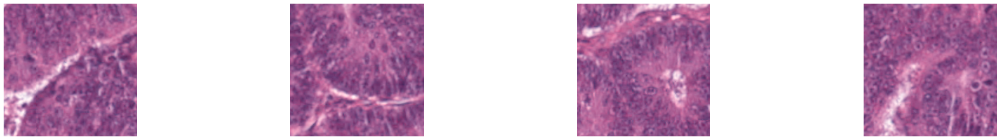

In [ ]:
"""
Purpose:
    Show two image sets side-by-side (alternating order) in one single row
    without any text, captions, or axes. Perfect for quick side-by-side comparison.

Logic:
    1. Collect all images from two sources (folders or explicit lists).
    2. Alternate between them: [img1_set1, img1_set2, img2_set1, img2_set2, ...].
    3. Display them in one horizontal row.
    4. No text, no axes, clean output.
"""

from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path

# ======== CONFIG ========
# Replace with your actual paths or use glob for automatic discovery.
SET1_DIR = Path("/content/blurry_samples")   # example path for your first set
SET2_DIR = Path("/content/bad_manual")       # example path for your second set

# Or if your files are directly in /content, list them explicitly:
set1_files = [
    "/content/lungn3257.jpeg",
    "/content/lungn4637.jpeg",
    "/content/lungn1690.jpeg",
    "/content/lungn926.jpeg",
]

set2_files = [
    "/content/TUM-IGHMQCAH.tif",
    "/content/TUM-KRVWDDCV.tif",
    "/content/TUM-MVFCNHVF.tif",
    "/content/TUM-MWHDSDVW.tif",
]

# ======== BUILD INTERLEAVED SEQUENCE ========
imgs = []
for i in range(max(len(set1_files), len(set2_files))):
    if i < len(set1_files):
        imgs.append(set1_files[i])
    if i < len(set2_files):
        imgs.append(set2_files[i])

# ======== DISPLAY ROW ========
plt.figure(figsize=(4*len(imgs), 4))
for idx, path in enumerate(imgs):
    try:
        img = Image.open(path)
        plt.subplot(1, len(imgs), idx + 1)
        plt.imshow(img)
        plt.axis("off")
    except Exception as e:
        print(f"Error loading {path}: {e}")
plt.tight_layout()
plt.show()


In [ ]:
"""
Purpose:
    From an existing Stage-2 cleaning CSV (with mean_intensity, tissue_ratio, sharpness_var),
    pick a "better" sample of blurriest patches that:
      (a) actually contain tissue (filter by tissue_ratio),
      (b) are not over/under-exposed (filter by mean_intensity),
      (c) are not trivially uniform (filter by grayscale std),
      (d) are visually diverse (greedy selection with cosine distance over HSV hist embeddings).

Logic:
    1) Load the CSV; drop rows with missing metrics.
    2) Filter by tissue_ratio ∈ [MIN_TISSUE_RATIO, MAX_TISSUE_RATIO].
    3) Filter by mean_intensity ∈ [MIN_MEAN_INT, MAX_MEAN_INT].
    4) Sort by sharpness_var ascending (blurriest first).
    5) For the top K candidates, compute quick per-image checks:
       - grayscale std (exclude too-uniform tiles)
       - HSV histogram embedding (for diversity)
    6) Greedily pick TOP_N images ensuring pairwise cosine distance ≥ DIVERSITY_MIN_DIST.
    7) Display grid.

Notes:
    - Adjust thresholds to your dataset. Start conservative, then tighten.
    - Uses only your existing CSV + the image files at recorded paths.
    - Safe to run: doesn't move or modify files.
"""

# ========= Imports =========
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import cv2
import matplotlib.pyplot as plt

# ========= Config =========
CSV_PATH = Path("/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv")  # <-- change per class
TOP_N = 6                 # how many images to show
CANDIDATE_K = 200         # check diversity only among the top-K blurriest after filtering

# Content filters
MIN_TISSUE_RATIO = 0.20   # ignore near-empty tiles
MAX_TISSUE_RATIO = 0.98   # ignore almost-full background bleed
MIN_MEAN_INT     = 15     # too dark is often artifact/background
MAX_MEAN_INT     = 235    # too bright is often background
MIN_GRAY_STD     = 6.0    # exclude very uniform tiles (std in [0..~70] on 8-bit)

# Diversity (cosine distance over HSV hist embeddings)
DIVERSITY_MIN_DIST = 0.15  # increase to demand more variety (0.15–0.30 reasonable)

# HSV histogram settings
HSV_BINS = (8, 8, 8)       # 8x8x8 = 512-dim histogram
HSV_RANGES = [0, 180, 0, 256, 0, 256]  # H:0-180 in OpenCV, S:0-256, V:0-256

# ========= Helpers =========
def load_img_rgb(path: str):
    img = Image.open(path).convert("RGB")
    return np.array(img)

def gray_std(arr_rgb: np.ndarray) -> float:
    g = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2GRAY)
    return float(g.std())

def hsv_hist_embedding(arr_rgb: np.ndarray) -> np.ndarray:
    hsv = cv2.cvtColor(arr_rgb, cv2.COLOR_RGB2HSV)
    hist = cv2.calcHist([hsv], [0,1,2], None, HSV_BINS, HSV_RANGES)
    hist = cv2.normalize(hist, hist).flatten().astype(np.float32)
    return hist

def cosine_distance(a: np.ndarray, b: np.ndarray) -> float:
    # 1 - cosine similarity
    denom = (np.linalg.norm(a) * np.linalg.norm(b)) + 1e-12
    return 1.0 - float(np.dot(a, b) / denom)

def greedy_diverse_pick(candidates, top_n, min_dist):
    """
    candidates: list of dicts with keys { 'path', 'sharp', 'embed', 'row' }
    Returns: list of selected candidate dicts
    """
    selected = []
    for cand in candidates:
        if len(selected) == 0:
            selected.append(cand)
            if len(selected) >= top_n:
                break
            continue
        # enforce diversity vs all already-selected
        ok = True
        for s in selected:
            d = cosine_distance(cand['embed'], s['embed'])
            if d < min_dist:
                ok = False
                break
        if ok:
            selected.append(cand)
            if len(selected) >= top_n:
                break
    # If not enough diverse picks, relax by just filling up (still sorted by blur)
    if len(selected) < top_n:
        pool_paths = set([c['path'] for c in selected])
        for cand in candidates:
            if cand['path'] in pool_paths:
                continue
            selected.append(cand)
            pool_paths.add(cand['path'])
            if len(selected) >= top_n:
                break
    return selected[:top_n]

# ========= Load & Filter =========
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} rows from {CSV_PATH.name}")

need_cols = {"path","filename","sharpness_var","tissue_ratio","mean_intensity"}
missing = need_cols - set(df.columns)
if missing:
    raise ValueError(f"CSV missing columns: {missing}")

df = df.dropna(subset=["sharpness_var","tissue_ratio","mean_intensity"])
mask = (
    (df["tissue_ratio"].between(MIN_TISSUE_RATIO, MAX_TISSUE_RATIO)) &
    (df["mean_intensity"].between(MIN_MEAN_INT, MAX_MEAN_INT))
)
df_f = df.loc[mask].copy()
print(f"After content filters: {len(df_f)} remain "
      f"(tissue_ratio∈[{MIN_TISSUE_RATIO},{MAX_TISSUE_RATIO}], "
      f"mean_intensity∈[{MIN_MEAN_INT},{MAX_MEAN_INT}])")

# Sort by blur (lowest sharpness first)
df_f = df_f.sort_values("sharpness_var", ascending=True).reset_index(drop=True)

# ========= Build candidates with per-image checks (std + embedding) =========
candidates = []
checked = 0
for _, r in df_f.head(CANDIDATE_K).iterrows():
    p = r["path"]
    try:
        arr = load_img_rgb(p)
    except Exception as e:
        # quietly skip unreadable files
        continue

    # Exclude trivially uniform tiles
    gstd = gray_std(arr)
    if gstd < MIN_GRAY_STD:
        continue

    # Diversity embedding
    emb = hsv_hist_embedding(arr)

    candidates.append({
        "path": p,
        "filename": r["filename"],
        "sharp": float(r["sharpness_var"]),
        "tissue_ratio": float(r["tissue_ratio"]),
        "mean_intensity": float(r["mean_intensity"]),
        "embed": emb,
    })
    checked += 1

print(f"Candidates after GRAY STD filter among top {CANDIDATE_K}: {len(candidates)} (checked={checked})")

if len(candidates) == 0:
    raise RuntimeError("No candidates passed the filters. Relax thresholds slightly and retry.")

# ========= Greedy diverse selection =========
selected = greedy_diverse_pick(candidates, TOP_N, DIVERSITY_MIN_DIST)

print("\nSelected images:")
for s in selected:
    print(f"{s['filename']:30s}  sharp={s['sharp']:.2f}  tissue={s['tissue_ratio']:.2f}  meanI={s['mean_intensity']:.1f}")

# ========= Display =========
cols = 3 if TOP_N >= 6 else 2
rows = int(np.ceil(len(selected) / cols))
plt.figure(figsize=(5*cols, 5*rows))
for i, s in enumerate(selected):
    img = Image.open(s["path"])
    plt.subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.title(f"{s['filename']}\nsharp={s['sharp']:.1f} | tissue={s['tissue_ratio']:.2f}", fontsize=9)
    plt.axis("off")
plt.tight_layout()
plt.show()


Loaded 5000 rows from stage2_quality_lung_n.csv
After content filters: 0 remain (tissue_ratio∈[0.2,0.98], mean_intensity∈[15,235])
Candidates after GRAY STD filter among top 200: 0 (checked=0)


RuntimeError: No candidates passed the filters. Relax thresholds slightly and retry.

In [ ]:
"""
Purpose:
    Load and inspect the model-audit log generated in Stage 3.
    This CSV contains per-image details like filename, true label, predicted label,
    ensemble confidence, and final audit status (flagged / uncertain / clean).
"""

import pandas as pd

# Path to your model-audit CSV
csv_path = "/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv"

# Load the file using pandas
df_audit = pd.read_csv(csv_path)

# Display the shape and first few rows
print(f"CSV loaded successfully! Shape: {df_audit.shape}")
display(df_audit.head(10))  # display first 10 rows for better context


CSV loaded successfully! Shape: (5000, 7)


,filename,path,mean_intensity,tissue_ratio,sharpness_var,status,reason
0,lungn1.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,182.485479,1.0,21.750267,keep,NaN
1,lungn10.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,182.198746,1.0,7.891386,reject,blurry:7.9
2,lungn100.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,180.603390,1.0,11.483685,keep,NaN
3,lungn1000.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,181.879172,1.0,12.655943,keep,NaN
4,lungn1001.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,178.270070,1.0,19.525960,keep,NaN
5,lungn1002.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,178.270070,1.0,19.525960,keep,NaN
6,lungn1003.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,171.482827,1.0,14.324829,keep,NaN
7,lungn1004.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,182.493632,1.0,17.559607,keep,NaN
8,lungn1005.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,181.443151,1.0,20.217670,keep,NaN
9,lungn1006.jpeg,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,180.567456,1.0,21.952298,keep,NaN


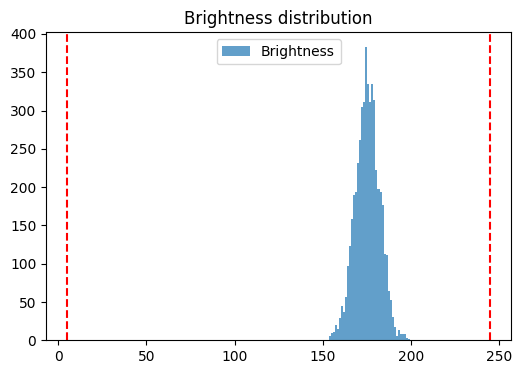

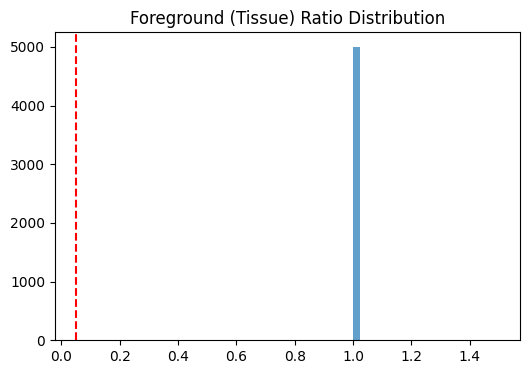

In [ ]:
import matplotlib.pyplot as plt

df = pd.read_csv(LOG_DIR / "stage2_quality_lung_n.csv")

plt.figure(figsize=(6,4))
plt.hist(df["mean_intensity"], bins=40, alpha=0.7, label="Brightness")
plt.axvline(MAX_MEAN_INTENSITY, color="r", linestyle="--")
plt.axvline(MIN_MEAN_INTENSITY, color="r", linestyle="--")
plt.title("Brightness distribution")
plt.legend()
plt.show()

plt.figure(figsize=(6,4))
plt.hist(df["tissue_ratio"], bins=40, alpha=0.7)
plt.axvline(TISSUE_MIN_RATIO, color="r", linestyle="--")
plt.title("Foreground (Tissue) Ratio Distribution")
plt.show()


🧾 Showing 9 randomly selected rejected patches...


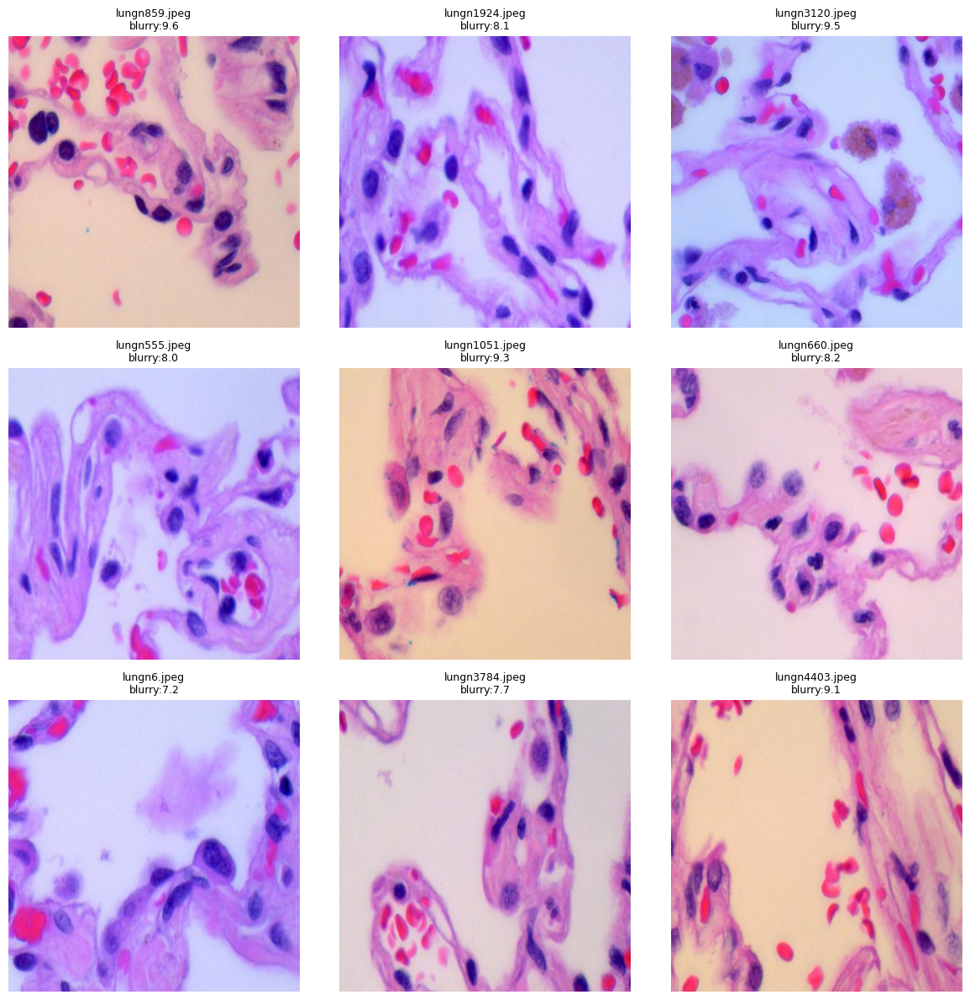

In [ ]:
"""
Display sample quarantined images (rejected patches) with reasons.
Works on the output of Step 2 (stage2_quality_lung_n.csv)
"""

import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# === Load the CSV ===
csv_path = "/content/drive/MyDrive/histo/clean_logs/stage2_quality_lung_n.csv"
df = pd.read_csv(csv_path)

# Filter only rejected
rejects = df[df["status"] == "reject"]

# Folder where rejected images were moved
Q_QUALITY = Path("/content/drive/MyDrive/histo/quarantine/quality")

# === Random sample ===
num_to_show = min(9, len(rejects))
if num_to_show == 0:
    print("✅ No images rejected — nothing to display.")
else:
    print(f"🧾 Showing {num_to_show} randomly selected rejected patches...")
    sample = rejects.sample(num_to_show)

    cols = 3
    rows = int(np.ceil(num_to_show / cols))
    plt.figure(figsize=(4*cols, 4*rows))

    for i, row in enumerate(sample.itertuples(index=False)):
        img_path = Q_QUALITY / row.filename
        if not img_path.exists():
            continue
        img = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"{row.filename}\n{row.reason}", fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# MODEL BASED AUDITING

In [ ]:
"""
Restore images belonging to lung_n from /quarantine/quality back to /LC25000/lung_n.
- Matches by filename prefix 'lungn' (LC25000 naming convention).
- Then re-run Step-2 filtering on that folder with relaxed thresholds.
"""

from pathlib import Path
import shutil
from tqdm import tqdm

ROOT      = Path("/content/drive/MyDrive/histo")
SRC_QUAR  = ROOT / "quarantine" / "quality"
DST_CLASS = ROOT / "LC25000" / "lung_n"

DST_CLASS.mkdir(parents=True, exist_ok=True)

moved = 0
for p in tqdm(list(SRC_QUAR.glob("lungn*.jpeg")) + list(SRC_QUAR.glob("lungn*.jpg")), desc="Restoring lung_n"):
    shutil.move(str(p), str(DST_CLASS / p.name))
    moved += 1

print(f"✅ Restored {moved} files to {DST_CLASS}")


Restoring lung_n: 100%|██████████| 802/802 [00:02<00:00, 316.40it/s]

✅ Restored 802 files to /content/drive/MyDrive/histo/LC25000/lung_n


Auditing folder: /content/drive/MyDrive/histo/LC25000/lung_n  |  images: 5000  |  true_label: 0


Ensemble audit: 100%|██████████| 79/79 [01:59<00:00,  1.52s/it]



Saved → /content/drive/MyDrive/histo/clean_logs/stage3_model_audit_lung_n.csv
Flagged & moved: 635  |  Uncertain (kept): 807


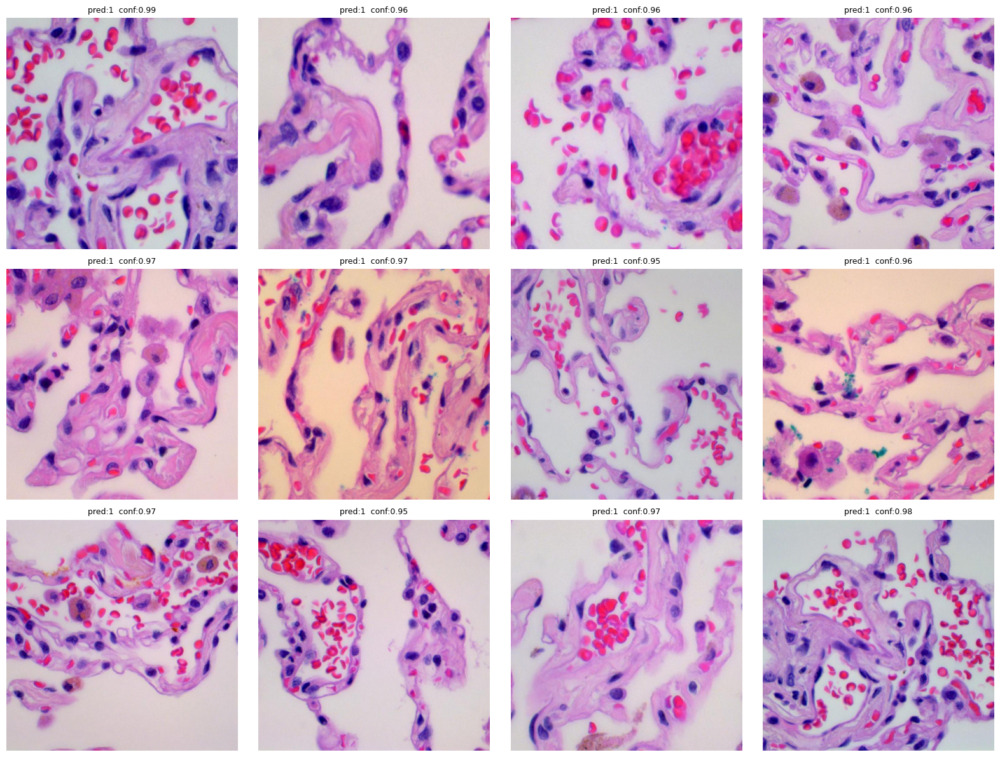

In [ ]:
"""
Step 3 — Model-based Label Audit (Single-Class, Ensemble)
Dataset folder example: /content/drive/MyDrive/histo/LC25000/lung_n

Purpose:
    Run an ensemble (ResNet50 + EfficientNet-B3 + ViT-B/16) ONLY on one LC25000 class folder (≈5k images).
    Compare ensemble prediction with the folder's true binary label:
        benign (0) if folder ends with "_n"; else malignant (1).

What happens:
    1) Build a dataset from a single class directory.
    2) Load 3 pretrained models (timm, ImageNet weights).
    3) Average logits across models; softmax -> probability & predicted class.
    4) If pred != true AND conf >= CONF_DISAGREE -> move image to /quarantine/label_audit.
    5) Save CSV with per-image predictions, conf, flags; show a preview grid.

Why needed:
    Catches probable mislabels in the target class quickly (faster demo).
    Keeps high precision by using high-confidence disagreements only.

Pitfalls:
    - If you see too many/too few flags, tune CONF_DISAGREE (0.90–0.98).
    - Reduce BATCH_SIZE if GPU memory is a problem.
    - If the folder is empty (e.g., images were moved earlier), restore from quarantine or switch the FOLDER_NAME below.
"""

from pathlib import Path
import os, shutil, random
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import timm
from tqdm import tqdm
import matplotlib.pyplot as plt

# =================== CONFIG ===================
ROOT         = Path("/content/drive/MyDrive/histo")
LC_ROOT      = ROOT / "LC25000"

FOLDER_NAME  = "lung_n"          # <-- change to: lung_aca / lung_scc / colon_aca / colon_n
DATA_DIR     = LC_ROOT / FOLDER_NAME

LOG_DIR      = ROOT / "clean_logs"
Q_LABEL      = ROOT / "quarantine" / "label_audit"
for d in (LOG_DIR, Q_LABEL): d.mkdir(parents=True, exist_ok=True)

# Binary label derived from folder name
TRUE_LABEL   = 0 if FOLDER_NAME.endswith("_n") else 1

# Ensemble
ENSEMBLE_MODELS = [
    "resnet50",
    "tf_efficientnet_b3_ns",
    "vit_base_patch16_224"
]
INPUT_SIZE   = 224
BATCH_SIZE   = 64
NUM_WORKERS  = 2

# Confidence thresholds
CONF_DISAGREE  = 0.95   # disagree + >= this -> move to quarantine
CONF_UNCERTAIN = 0.60   # mark uncertain (kept)

# Optional: limit max images to speed up a quick smoke test (set to None for all)
MAX_IMAGES    = None    # e.g., 1000 for a faster demo

# =============== DATASET (single folder) ===============
class SingleFolderBinary(Dataset):
    def __init__(self, folder: Path, true_label: int, input_size: int, max_images=None):
        self.items = []
        exts = (".jpg", ".jpeg", ".png")
        for p in sorted(folder.iterdir()):
            if p.suffix.lower() in exts:
                self.items.append(str(p))
        if max_images is not None:
            self.items = self.items[:max_images]

        self.true = int(true_label)
        self.tfm = T.Compose([
            T.Resize((input_size, input_size)),
            T.ToTensor(),
            T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
        ])

    def __len__(self): return len(self.items)
    def __getitem__(self, idx):
        path = self.items[idx]
        img  = Image.open(path).convert("RGB")
        x    = self.tfm(img)
        y    = self.true
        return x, y, path

# =============== MODEL LOADER =================
def load_teacher(name: str, num_classes: int = 2, device: torch.device = torch.device("cpu")):
    m = timm.create_model(name, pretrained=True, num_classes=num_classes)
    m.eval().to(device)
    return m

# =============== AUDIT LOOP ===================
def audit_folder_with_ensemble(folder_path: Path, true_label: int):
    ds = SingleFolderBinary(folder_path, true_label, INPUT_SIZE, max_images=MAX_IMAGES)
    print(f"Auditing folder: {folder_path}  |  images: {len(ds)}  |  true_label: {true_label}")
    if len(ds) == 0:
        print("No images found. Did a previous step move everything? Restore or choose another folder.")
        return pd.DataFrame(), []

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    dl = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

    teachers = [load_teacher(n, num_classes=2, device=device) for n in ENSEMBLE_MODELS]

    rows = []
    quarantined = []

    with torch.no_grad():
        for xb, yb, paths in tqdm(dl, desc="Ensemble audit"):
            xb = xb.to(device, non_blocking=True)
            logits_sum = None
            for m in teachers:
                out = m(xb)                             # [B, 2]
                logits_sum = out if logits_sum is None else (logits_sum + out)

            logits_avg = logits_sum / float(len(teachers))
            probs = torch.softmax(logits_avg, dim=1).cpu().numpy()
            preds = probs.argmax(axis=1)
            confs = probs.max(axis=1)
            ytrue = int(true_label)

            for path, y_pred, conf in zip(paths, preds, confs):
                disagree  = int(y_pred != ytrue)
                uncertain = int(conf < CONF_UNCERTAIN)
                moved_flag = 0
                qpath = path

                if disagree and conf >= CONF_DISAGREE:
                    src = Path(path)
                    dst = Q_LABEL / src.name
                    k = 1
                    while dst.exists():
                        dst = Q_LABEL / f"{dst.stem}__{k}{dst.suffix}"
                        k += 1
                    try:
                        shutil.move(str(src), str(dst))
                        qpath = str(dst); moved_flag = 1
                    except Exception:
                        qpath = path; moved_flag = 0

                rows.append({
                    "path": path,
                    "true": ytrue,
                    "pred": int(y_pred),
                    "conf": float(conf),
                    "disagree": disagree,
                    "uncertain": uncertain,
                    "quarantined": moved_flag,
                    "final_path": qpath
                })
                if moved_flag:
                    quarantined.append({"path": path, "moved_to": qpath, "pred": int(y_pred), "conf": float(conf)})

    df = pd.DataFrame(rows)
    csv_main = LOG_DIR / f"stage3_model_audit_{folder_path.name}.csv"
    csv_moves = LOG_DIR / f"stage3_label_quarantine_moves_{folder_path.name}.csv"
    df.to_csv(csv_main, index=False)
    pd.DataFrame(quarantined).to_csv(csv_moves, index=False)

    print(f"\nSaved → {csv_main}")
    print(f"Flagged & moved: {int((df['quarantined']==1).sum())}  |  Uncertain (kept): {int((df['uncertain']==1).sum())}")
    return df, quarantined

# =============== RUN ==========================
df_single, q_single = audit_folder_with_ensemble(DATA_DIR, TRUE_LABEL)

# =============== PREVIEW FLAGGED ==============
to_show = q_single[:]
random.shuffle(to_show)
to_show = to_show[:min(12, len(to_show))]

if len(to_show) == 0:
    print("No high-confidence disagreements to preview.")
else:
    cols = 4
    rows = int(np.ceil(len(to_show)/cols))
    plt.figure(figsize=(4*cols, 4*rows))
    for i, q in enumerate(to_show):
        p = q["moved_to"] if Path(q["moved_to"]).exists() else q["path"]
        try:
            im = Image.open(p)
        except:
            continue
        plt.subplot(rows, cols, i+1)
        plt.imshow(im)
        plt.title(f"pred:{q['pred']}  conf:{q['conf']:.2f}", fontsize=9)
        plt.axis("off")
    plt.tight_layout(); plt.show()


In [ ]:
"""
Purpose:
    Load and inspect the model-audit log generated in Stage 3.
    This CSV contains per-image details like filename, true label, predicted label,
    ensemble confidence, and final audit status (flagged / uncertain / clean).
"""

import pandas as pd

# Path to your model-audit CSV
csv_path = "/content/drive/MyDrive/histo/clean_logs/stage3_model_audit_lung_n.csv"

# Load the file using pandas
df_audit = pd.read_csv(csv_path)

# Display the shape and first few rows
print(f"CSV loaded successfully! Shape: {df_audit.shape}")
display(df_audit.head(10))  # display first 10 rows for better context


CSV loaded successfully! Shape: (5000, 8)


,path,true,pred,conf,disagree,uncertain,quarantined,final_path
0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.847360,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
1,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.889964,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
2,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,0,0.645616,0,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
3,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.943815,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
4,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.861191,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
5,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.767296,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
6,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.724055,1,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
7,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.506215,1,1,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
8,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,0,0.637874,0,0,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...
9,/content/drive/MyDrive/histo/LC25000/lung_n/lu...,0,1,0.554981,1,1,0,/content/drive/MyDrive/histo/LC25000/lung_n/lu...


Loaded 5000 records from stage3_model_audit_lung_n.csv


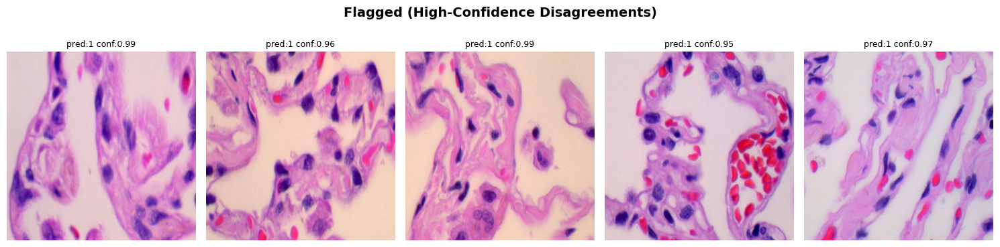

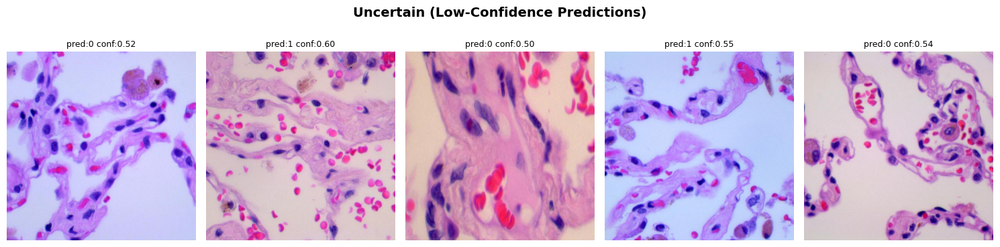

In [ ]:
"""
Purpose:
    Display 5 random images each from 'uncertain' and 'flagged' (quarantined) sets
    after ensemble label audit.

Assumptions:
    - stage3_model_audit_<class>.csv already exists in LOG_DIR
    - Columns: [path, true, pred, conf, disagree, uncertain, quarantined, final_path]
"""

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from pathlib import Path
import random

# ==== CONFIG ====
CLASS_NAME = "lung_n"   # change if needed
ROOT = Path("/content/drive/MyDrive/histo")
LOG_DIR = ROOT / "clean_logs"
CSV_PATH = LOG_DIR / f"stage3_model_audit_{CLASS_NAME}.csv"

# ==== LOAD DATA ====
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} records from {CSV_PATH.name}")

# ==== FILTER GROUPS ====
df_uncertain = df[df["uncertain"] == 1].sample(min(5, len(df[df["uncertain"] == 1])), random_state=42)
df_flagged   = df[df["quarantined"] == 1].sample(min(5, len(df[df["quarantined"] == 1])), random_state=42)

def show_images(subset, title):
    if len(subset) == 0:
        print(f"No {title.lower()} images found.")
        return
    plt.figure(figsize=(15, 4))
    for i, (_, row) in enumerate(subset.iterrows()):
        path = Path(row["final_path"]) if Path(str(row["final_path"])).exists() else Path(str(row["path"]))
        try:
            img = Image.open(path)
        except:
            continue
        plt.subplot(1, len(subset), i + 1)
        plt.imshow(img)
        plt.title(f"pred:{row['pred']} conf:{row['conf']:.2f}", fontsize=9)
        plt.axis("off")
    plt.suptitle(title, fontsize=14, weight="bold")
    plt.tight_layout()
    plt.show()

# ==== DISPLAY BOTH ====
show_images(df_flagged, "Flagged (High-Confidence Disagreements)")
show_images(df_uncertain, "Uncertain (Low-Confidence Predictions)")


🔍 Finding a random image...

Selected: lungn3500.jpeg



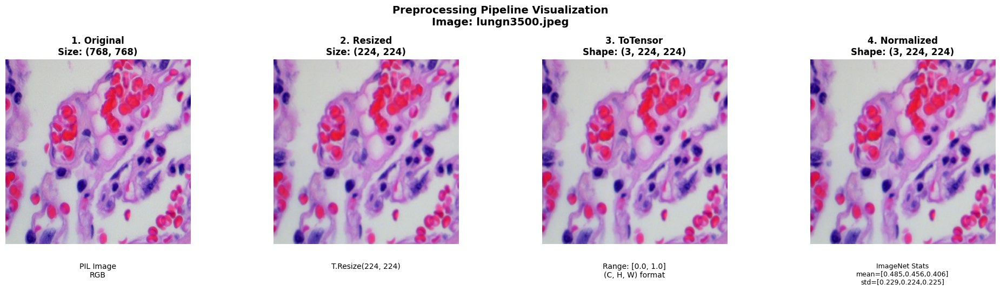


PREPROCESSING STATISTICS
Image Path: /content/drive/MyDrive/histo/LC25000/lung_n/lungn3500.jpeg

1. Original Image:
   - Size: (768, 768)
   - Mode: RGB

2. After Resize:
   - Size: (224, 224)

3. After ToTensor:
   - Shape: (3, 224, 224) (C×H×W)
   - Dtype: torch.float32
   - Range: [0.000, 0.984]
   - Mean: 0.670

4. After Normalize:
   - Shape: (3, 224, 224)
   - Dtype: torch.float32
   - Range: [-2.036, 2.180]
   - Mean: 0.974
   - Std: 0.846

✅ Visualization complete!

💡 Tip: Run this cell again to see a different random image!


In [ ]:
"""
Preprocessing Pipeline Visualization
Shows: Original → Resized → ToTensor → Normalized
"""

import random
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T

# =================== CONFIG ===================
ROOT = Path("/content/drive/MyDrive/histo")
LC_ROOT = ROOT / "LC25000"
FOLDER_NAME = "lung_n"  # Change to any folder: lung_aca, lung_scc, colon_aca, colon_n
DATA_DIR = LC_ROOT / FOLDER_NAME

INPUT_SIZE = 224

# =================== GET RANDOM IMAGE ===================
def get_random_image(folder: Path):
    """Get a random image from the folder."""
    exts = (".jpg", ".jpeg", ".png")
    images = [p for p in folder.iterdir() if p.suffix.lower() in exts]

    if len(images) == 0:
        raise ValueError(f"No images found in {folder}")

    return random.choice(images)

# =================== PREPROCESSING STEPS ===================
def apply_preprocessing_steps(image_path: Path, input_size: int = 224):
    """
    Apply each preprocessing step and return intermediate results.

    Returns:
        original: PIL Image (original)
        resized: PIL Image (resized)
        tensor: Tensor (0-1 range)
        normalized: Tensor (normalized with ImageNet stats)
    """
    # Step 1: Load original image
    original = Image.open(image_path).convert("RGB")

    # Step 2: Resize
    resize_transform = T.Resize((input_size, input_size))
    resized = resize_transform(original)

    # Step 3: ToTensor (converts to [0, 1] range and changes to C×H×W)
    to_tensor = T.ToTensor()
    tensor = to_tensor(resized)

    # Step 4: Normalize (ImageNet statistics)
    normalize = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    normalized = normalize(tensor)

    return original, resized, tensor, normalized

# =================== DENORMALIZE HELPER ===================
def denormalize_tensor(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Denormalize a tensor to make it visually displayable.
    """
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    denorm = tensor * std + mean
    denorm = torch.clamp(denorm, 0, 1)  # Clip to valid range
    return denorm

# =================== VISUALIZATION ===================
def visualize_preprocessing(image_path: Path, input_size: int = 224):
    """
    Visualize all preprocessing steps in one row.
    """
    # Get all preprocessing stages
    original, resized, tensor, normalized = apply_preprocessing_steps(image_path, input_size)

    # Prepare for visualization
    tensor_img = tensor.permute(1, 2, 0).numpy()  # Convert to H×W×C for matplotlib
    normalized_denorm = denormalize_tensor(normalized)
    normalized_img = normalized_denorm.permute(1, 2, 0).numpy()

    # Create figure with 4 subplots
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # 1. Original Image
    axes[0].imshow(original)
    axes[0].set_title(f"1. Original\nSize: {original.size}", fontsize=12, fontweight='bold')
    axes[0].axis('off')
    axes[0].text(0.5, -0.1, f"PIL Image\nRGB",
                ha='center', va='top', transform=axes[0].transAxes, fontsize=10)

    # 2. Resized Image
    axes[1].imshow(resized)
    axes[1].set_title(f"2. Resized\nSize: {resized.size}", fontsize=12, fontweight='bold')
    axes[1].axis('off')
    axes[1].text(0.5, -0.1, f"T.Resize({input_size}, {input_size})",
                ha='center', va='top', transform=axes[1].transAxes, fontsize=10)

    # 3. ToTensor
    axes[2].imshow(tensor_img)
    axes[2].set_title(f"3. ToTensor\nShape: {tuple(tensor.shape)}", fontsize=12, fontweight='bold')
    axes[2].axis('off')
    axes[2].text(0.5, -0.1, f"Range: [0.0, 1.0]\n(C, H, W) format",
                ha='center', va='top', transform=axes[2].transAxes, fontsize=10)

    # 4. Normalized
    axes[3].imshow(normalized_img)
    axes[3].set_title(f"4. Normalized\nShape: {tuple(normalized.shape)}", fontsize=12, fontweight='bold')
    axes[3].axis('off')
    axes[3].text(0.5, -0.1, f"ImageNet Stats\nmean=[0.485,0.456,0.406]\nstd=[0.229,0.224,0.225]",
                ha='center', va='top', transform=axes[3].transAxes, fontsize=9)

    plt.suptitle(f"Preprocessing Pipeline Visualization\nImage: {image_path.name}",
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\n{'='*60}")
    print(f"PREPROCESSING STATISTICS")
    print(f"{'='*60}")
    print(f"Image Path: {image_path}")
    print(f"\n1. Original Image:")
    print(f"   - Size: {original.size}")
    print(f"   - Mode: {original.mode}")

    print(f"\n2. After Resize:")
    print(f"   - Size: {resized.size}")

    print(f"\n3. After ToTensor:")
    print(f"   - Shape: {tuple(tensor.shape)} (C×H×W)")
    print(f"   - Dtype: {tensor.dtype}")
    print(f"   - Range: [{tensor.min():.3f}, {tensor.max():.3f}]")
    print(f"   - Mean: {tensor.mean():.3f}")

    print(f"\n4. After Normalize:")
    print(f"   - Shape: {tuple(normalized.shape)}")
    print(f"   - Dtype: {normalized.dtype}")
    print(f"   - Range: [{normalized.min():.3f}, {normalized.max():.3f}]")
    print(f"   - Mean: {normalized.mean():.3f}")
    print(f"   - Std: {normalized.std():.3f}")
    print(f"{'='*60}\n")

# =================== RUN ===================
if __name__ == "__main__":
    print("🔍 Finding a random image...\n")

    # Get random image
    random_image = get_random_image(DATA_DIR)
    print(f"Selected: {random_image.name}\n")

    # Visualize preprocessing
    visualize_preprocessing(random_image, INPUT_SIZE)

    print("✅ Visualization complete!")
    print("\n💡 Tip: Run this cell again to see a different random image!")

🔍 Finding a random image...

Selected: lungn65.jpeg



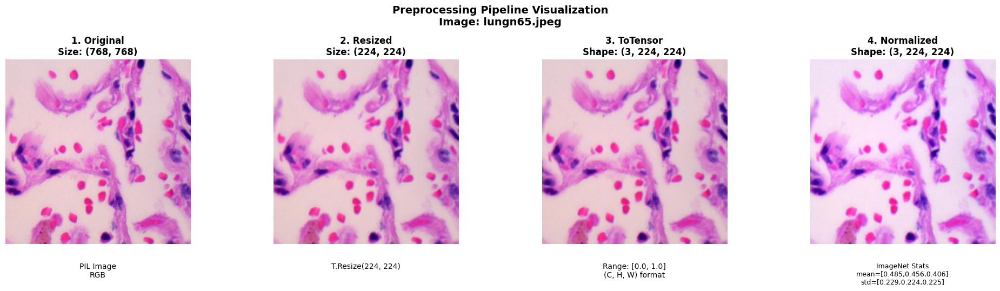


PREPROCESSING STATISTICS
Image Path: /content/drive/MyDrive/histo/LC25000/lung_n/lungn65.jpeg

1. Original Image:
   - Size: (768, 768)
   - Mode: RGB

2. After Resize:
   - Size: (224, 224)

3. After ToTensor:
   - Shape: (3, 224, 224) (C×H×W)
   - Dtype: torch.float32
   - Range: [0.000, 1.000]
   - Mean: 0.749

4. After Normalize:
   - Shape: (3, 224, 224)
   - Dtype: torch.float32
   - Range: [-2.084, 2.249]
   - Mean: 1.326
   - Std: 0.764

✅ Visualization complete!

💡 Tip: Run this cell again to see a different random image!


In [ ]:
"""
Preprocessing Pipeline Visualization
Shows: Original → Resized → ToTensor → Normalized
"""

import random
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T

# =================== CONFIG ===================
ROOT = Path("/content/drive/MyDrive/histo")
LC_ROOT = ROOT / "LC25000"
FOLDER_NAME = "lung_n"  # Change to any folder: lung_aca, lung_scc, colon_aca, colon_n
DATA_DIR = LC_ROOT / FOLDER_NAME

INPUT_SIZE = 224

# =================== GET RANDOM IMAGE ===================
def get_random_image(folder: Path):
    """Get a random image from the folder."""
    exts = (".jpg", ".jpeg", ".png")
    images = [p for p in folder.iterdir() if p.suffix.lower() in exts]

    if len(images) == 0:
        raise ValueError(f"No images found in {folder}")

    return random.choice(images)

# =================== PREPROCESSING STEPS ===================
def apply_preprocessing_steps(image_path: Path, input_size: int = 224):
    """
    Apply each preprocessing step and return intermediate results.

    Returns:
        original: PIL Image (original)
        resized: PIL Image (resized)
        tensor: Tensor (0-1 range)
        normalized: Tensor (normalized with ImageNet stats)
    """
    # Step 1: Load original image
    original = Image.open(image_path).convert("RGB")

    # Step 2: Resize
    resize_transform = T.Resize((input_size, input_size))
    resized = resize_transform(original)

    # Step 3: ToTensor (converts to [0, 1] range and changes to C×H×W)
    to_tensor = T.ToTensor()
    tensor = to_tensor(resized)

    # Step 4: Normalize (ImageNet statistics)
    normalize = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    normalized = normalize(tensor)

    return original, resized, tensor, normalized

# =================== DENORMALIZE HELPER ===================
def denormalize_tensor(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Denormalize a tensor to make it visually displayable.
    """
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    denorm = tensor * std + mean
    denorm = torch.clamp(denorm, 0, 1)  # Clip to valid range
    return denorm

# =================== VISUALIZATION ===================
def visualize_preprocessing(image_path: Path, input_size: int = 224):
    """
    Visualize all preprocessing steps in one row.
    """
    # Get all preprocessing stages
    original, resized, tensor, normalized = apply_preprocessing_steps(image_path, input_size)

    # Prepare for visualization
    tensor_img = tensor.permute(1, 2, 0).numpy()  # Convert to H×W×C for matplotlib

    # Show RAW normalized values (without denormalizing)
    normalized_raw = normalized.permute(1, 2, 0).numpy()
    # Clip to displayable range for visualization
    normalized_img = np.clip(normalized_raw, -2, 2)  # Clip extreme values
    normalized_img = (normalized_img - normalized_img.min()) / (normalized_img.max() - normalized_img.min())  # Scale to [0,1] for display

    # Create figure with 4 subplots
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # 1. Original Image
    axes[0].imshow(original)
    axes[0].set_title(f"1. Original\nSize: {original.size}", fontsize=12, fontweight='bold')
    axes[0].axis('off')
    axes[0].text(0.5, -0.1, f"PIL Image\nRGB",
                ha='center', va='top', transform=axes[0].transAxes, fontsize=10)

    # 2. Resized Image
    axes[1].imshow(resized)
    axes[1].set_title(f"2. Resized\nSize: {resized.size}", fontsize=12, fontweight='bold')
    axes[1].axis('off')
    axes[1].text(0.5, -0.1, f"T.Resize({input_size}, {input_size})",
                ha='center', va='top', transform=axes[1].transAxes, fontsize=10)

    # 3. ToTensor
    axes[2].imshow(tensor_img)
    axes[2].set_title(f"3. ToTensor\nShape: {tuple(tensor.shape)}", fontsize=12, fontweight='bold')
    axes[2].axis('off')
    axes[2].text(0.5, -0.1, f"Range: [0.0, 1.0]\n(C, H, W) format",
                ha='center', va='top', transform=axes[2].transAxes, fontsize=10)

    # 4. Normalized
    axes[3].imshow(normalized_img)
    axes[3].set_title(f"4. Normalized\nShape: {tuple(normalized.shape)}", fontsize=12, fontweight='bold')
    axes[3].axis('off')
    axes[3].text(0.5, -0.1, f"ImageNet Stats\nmean=[0.485,0.456,0.406]\nstd=[0.229,0.224,0.225]",
                ha='center', va='top', transform=axes[3].transAxes, fontsize=9)

    plt.suptitle(f"Preprocessing Pipeline Visualization\nImage: {image_path.name}",
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\n{'='*60}")
    print(f"PREPROCESSING STATISTICS")
    print(f"{'='*60}")
    print(f"Image Path: {image_path}")
    print(f"\n1. Original Image:")
    print(f"   - Size: {original.size}")
    print(f"   - Mode: {original.mode}")

    print(f"\n2. After Resize:")
    print(f"   - Size: {resized.size}")

    print(f"\n3. After ToTensor:")
    print(f"   - Shape: {tuple(tensor.shape)} (C×H×W)")
    print(f"   - Dtype: {tensor.dtype}")
    print(f"   - Range: [{tensor.min():.3f}, {tensor.max():.3f}]")
    print(f"   - Mean: {tensor.mean():.3f}")

    print(f"\n4. After Normalize:")
    print(f"   - Shape: {tuple(normalized.shape)}")
    print(f"   - Dtype: {normalized.dtype}")
    print(f"   - Range: [{normalized.min():.3f}, {normalized.max():.3f}]")
    print(f"   - Mean: {normalized.mean():.3f}")
    print(f"   - Std: {normalized.std():.3f}")
    print(f"{'='*60}\n")

# =================== RUN ===================
if __name__ == "__main__":
    print("🔍 Finding a random image...\n")

    # Get random image
    random_image = get_random_image(DATA_DIR)
    print(f"Selected: {random_image.name}\n")

    # Visualize preprocessing
    visualize_preprocessing(random_image, INPUT_SIZE)

    print("✅ Visualization complete!")
    print("\n💡 Tip: Run this cell again to see a different random image!")

🔍 Finding a random image...

Selected: lungn3670.jpeg



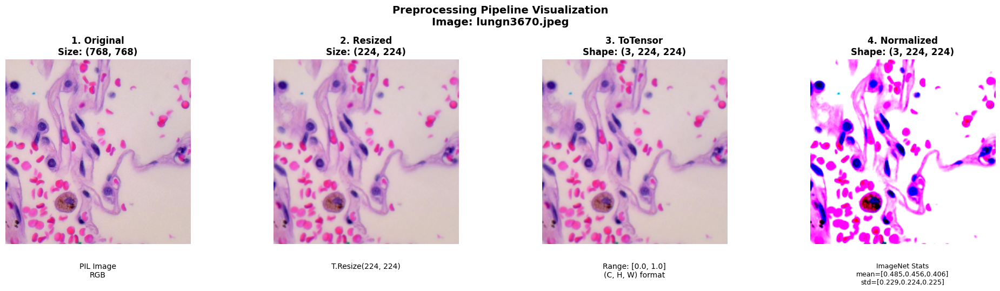


PREPROCESSING STATISTICS
Image Path: /content/drive/MyDrive/histo/LC25000/lung_n/lungn3670.jpeg

1. Original Image:
   - Size: (768, 768)
   - Mode: RGB

2. After Resize:
   - Size: (224, 224)

3. After ToTensor:
   - Shape: (3, 224, 224) (C×H×W)
   - Dtype: torch.float32
   - Range: [0.000, 1.000]
   - Mean: 0.748

4. After Normalize:
   - Shape: (3, 224, 224)
   - Dtype: torch.float32
   - Range: [-2.036, 2.249]
   - Mean: 1.321
   - Std: 0.610

✅ Visualization complete!

💡 Tip: Run this cell again to see a different random image!


In [ ]:
"""
Preprocessing Pipeline Visualization
Shows: Original → Resized → ToTensor → Normalized
"""

import random
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T

# =================== CONFIG ===================
ROOT = Path("/content/drive/MyDrive/histo")
LC_ROOT = ROOT / "LC25000"
FOLDER_NAME = "lung_n"  # Change to any folder: lung_aca, lung_scc, colon_aca, colon_n
DATA_DIR = LC_ROOT / FOLDER_NAME

INPUT_SIZE = 224

# =================== GET RANDOM IMAGE ===================
def get_random_image(folder: Path):
    """Get a random image from the folder."""
    exts = (".jpg", ".jpeg", ".png")
    images = [p for p in folder.iterdir() if p.suffix.lower() in exts]

    if len(images) == 0:
        raise ValueError(f"No images found in {folder}")

    return random.choice(images)

# =================== PREPROCESSING STEPS ===================
def apply_preprocessing_steps(image_path: Path, input_size: int = 224):
    """
    Apply each preprocessing step and return intermediate results.

    Returns:
        original: PIL Image (original)
        resized: PIL Image (resized)
        tensor: Tensor (0-1 range)
        normalized: Tensor (normalized with ImageNet stats)
    """
    # Step 1: Load original image
    original = Image.open(image_path).convert("RGB")

    # Step 2: Resize
    resize_transform = T.Resize((input_size, input_size))
    resized = resize_transform(original)

    # Step 3: ToTensor (converts to [0, 1] range and changes to C×H×W)
    to_tensor = T.ToTensor()
    tensor = to_tensor(resized)

    # Step 4: Normalize (ImageNet statistics)
    normalize = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    normalized = normalize(tensor)

    return original, resized, tensor, normalized

# =================== DENORMALIZE HELPER ===================
def denormalize_tensor(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Denormalize a tensor to make it visually displayable.
    """
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    denorm = tensor * std + mean
    denorm = torch.clamp(denorm, 0, 1)  # Clip to valid range
    return denorm

# =================== VISUALIZATION ===================
def visualize_preprocessing(image_path: Path, input_size: int = 224):
    """
    Visualize all preprocessing steps in one row.
    """
    # Get all preprocessing stages
    original, resized, tensor, normalized = apply_preprocessing_steps(image_path, input_size)

    # Prepare for visualization
    tensor_img = tensor.permute(1, 2, 0).numpy()  # Convert to H×W×C for matplotlib

    # Show RAW normalized values (TRUE normalized - will look very different!)
    normalized_raw = normalized.permute(1, 2, 0).numpy()
    # Just clip extreme values but DON'T rescale - show actual normalized distribution
    normalized_img = np.clip(normalized_raw, 0, 1)  # Clip to valid display range only

    # Create figure with 4 subplots
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # 1. Original Image
    axes[0].imshow(original)
    axes[0].set_title(f"1. Original\nSize: {original.size}", fontsize=12, fontweight='bold')
    axes[0].axis('off')
    axes[0].text(0.5, -0.1, f"PIL Image\nRGB",
                ha='center', va='top', transform=axes[0].transAxes, fontsize=10)

    # 2. Resized Image
    axes[1].imshow(resized)
    axes[1].set_title(f"2. Resized\nSize: {resized.size}", fontsize=12, fontweight='bold')
    axes[1].axis('off')
    axes[1].text(0.5, -0.1, f"T.Resize({input_size}, {input_size})",
                ha='center', va='top', transform=axes[1].transAxes, fontsize=10)

    # 3. ToTensor
    axes[2].imshow(tensor_img)
    axes[2].set_title(f"3. ToTensor\nShape: {tuple(tensor.shape)}", fontsize=12, fontweight='bold')
    axes[2].axis('off')
    axes[2].text(0.5, -0.1, f"Range: [0.0, 1.0]\n(C, H, W) format",
                ha='center', va='top', transform=axes[2].transAxes, fontsize=10)

    # 4. Normalized
    axes[3].imshow(normalized_img)
    axes[3].set_title(f"4. Normalized\nShape: {tuple(normalized.shape)}", fontsize=12, fontweight='bold')
    axes[3].axis('off')
    axes[3].text(0.5, -0.1, f"ImageNet Stats\nmean=[0.485,0.456,0.406]\nstd=[0.229,0.224,0.225]",
                ha='center', va='top', transform=axes[3].transAxes, fontsize=9)

    plt.suptitle(f"Preprocessing Pipeline Visualization\nImage: {image_path.name}",
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\n{'='*60}")
    print(f"PREPROCESSING STATISTICS")
    print(f"{'='*60}")
    print(f"Image Path: {image_path}")
    print(f"\n1. Original Image:")
    print(f"   - Size: {original.size}")
    print(f"   - Mode: {original.mode}")

    print(f"\n2. After Resize:")
    print(f"   - Size: {resized.size}")

    print(f"\n3. After ToTensor:")
    print(f"   - Shape: {tuple(tensor.shape)} (C×H×W)")
    print(f"   - Dtype: {tensor.dtype}")
    print(f"   - Range: [{tensor.min():.3f}, {tensor.max():.3f}]")
    print(f"   - Mean: {tensor.mean():.3f}")

    print(f"\n4. After Normalize:")
    print(f"   - Shape: {tuple(normalized.shape)}")
    print(f"   - Dtype: {normalized.dtype}")
    print(f"   - Range: [{normalized.min():.3f}, {normalized.max():.3f}]")
    print(f"   - Mean: {normalized.mean():.3f}")
    print(f"   - Std: {normalized.std():.3f}")
    print(f"{'='*60}\n")

# =================== RUN ===================
if __name__ == "__main__":
    print("🔍 Finding a random image...\n")

    # Get random image
    random_image = get_random_image(DATA_DIR)
    print(f"Selected: {random_image.name}\n")

    # Visualize preprocessing
    visualize_preprocessing(random_image, INPUT_SIZE)

    print("✅ Visualization complete!")
    print("\n💡 Tip: Run this cell again to see a different random image!")